In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time

import datetime
import operator 
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error

Import the data (make sure you update this on a daily basis)

In [3]:
confirmed_df = pd.read_csv("Confirmed.csv")
deaths_df = pd.read_csv("deaths.csv")
latest_data = pd.read_csv("latest.csv")
us_medical_data  = pd.read_csv("Usmedicaldata.csv")
apple_mobility = pd.read_csv("applemobilitytrends.csv")

#### Looking at the samples of data

In [4]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-07-05 04:21:28,33.93911,67.709953,120216,4962,74480.0,40774.0,Afghanistan,308.813571,4.127570
1,NaN,NaN,NaN,Albania,2021-07-05 04:21:28,41.15330,20.168300,132535,2456,130027.0,52.0,Albania,4605.427757,1.853095
2,NaN,NaN,NaN,Algeria,2021-07-05 04:21:28,28.03390,1.659600,141471,3755,98387.0,39329.0,Algeria,322.617184,2.654254
3,NaN,NaN,NaN,Andorra,2021-07-05 04:21:28,42.50630,1.521800,13918,127,13721.0,70.0,Andorra,18013.330745,0.912487
4,NaN,NaN,NaN,Angola,2021-07-05 04:21:28,-11.20270,17.873900,39230,913,33669.0,4648.0,Angola,119.362503,2.327301


In [5]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,7/10/21,7/11/21,7/12/21,7/13/21,7/14/21,7/15/21,7/16/21,7/17/21,7/18/21,7/19/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,131586,131586,134653,134653,136643,137853,137853,137853,137853,141489
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,132587,132592,132597,132608,132616,132629,132647,132665,132686,132697
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,145296,146064,146942,147883,148797,149906,151103,152210,153309,154486
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,14075,14075,14155,14167,14167,14239,14273,14273,14273,14359
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,39881,39958,40055,40138,40327,40530,40631,40707,40805,40906


In [6]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2021-07-05 04:31:17,32.3182,-86.9023,551298,11358,NaN,NaN,1.0,11243.671206,2685129.0,NaN,2.060229,84000001.0,USA,54762.955100,NaN
1,Alaska,US,2021-07-05 04:31:17,61.3707,-152.4044,71384,377,NaN,NaN,2.0,9757.977978,2382952.0,NaN,0.528130,84000002.0,USA,325742.367182,NaN
2,American Samoa,US,2021-07-05 04:31:17,-14.2710,-170.1320,0,0,NaN,NaN,60.0,0.000000,2140.0,NaN,NaN,16.0,ASM,3846.084722,NaN
3,Arizona,US,2021-07-05 04:31:17,33.7298,-111.4312,896960,17979,NaN,NaN,4.0,12323.050889,10294689.0,NaN,2.004437,84000004.0,USA,141435.489249,NaN
4,Arkansas,US,2021-07-05 04:31:17,34.9697,-92.3731,350579,5913,NaN,NaN,5.0,11617.023505,3135625.0,NaN,1.686638,84000005.0,USA,103904.196561,NaN


In [7]:
apple_mobility[:5]

,geo_type,region,transportation_type,alternative_name,sub-region,country,2020-01-13,2020-01-14,2020-01-15,2020-01-16,...,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18
0,country/region,Albania,driving,NaN,NaN,NaN,100.0,95.30,101.43,97.20,...,252.15,262.14,247.54,246.47,237.87,238.04,250.37,271.72,268.21,263.83
1,country/region,Albania,walking,NaN,NaN,NaN,100.0,100.68,98.93,98.46,...,231.22,215.14,196.89,234.84,226.27,231.51,236.29,244.01,234.80,202.00
2,country/region,Argentina,driving,NaN,NaN,NaN,100.0,97.07,102.45,111.21,...,105.66,109.23,71.06,70.97,74.74,79.38,87.62,110.41,119.97,76.00
3,country/region,Argentina,walking,NaN,NaN,NaN,100.0,95.11,101.37,112.67,...,81.02,88.71,49.75,60.64,65.44,65.97,75.18,89.34,90.67,50.82
4,country/region,Australia,driving,AU,NaN,NaN,100.0,102.98,104.21,108.63,...,104.99,87.32,95.39,99.25,102.74,104.53,96.91,82.88,67.98,79.44


In [8]:
cols = confirmed_df.keys()

In [9]:
cols

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '7/10/21', '7/11/21', '7/12/21', '7/13/21', '7/14/21', '7/15/21',
       '7/16/21', '7/17/21', '7/18/21', '7/19/21'],
      dtype='object', length=549)

#### Getting all the dates for the ongoing coronavirus pandemic 

In [10]:
confirmed = confirmed_df.loc[:, cols[4]:cols[-1]]
deaths = deaths_df.loc[:, cols[4]:cols[-1]]
# recoveries = recoveries_df.loc[:, cols[4]:cols[-1]]

In [11]:
confirmed[:4]

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,7/10/21,7/11/21,7/12/21,7/13/21,7/14/21,7/15/21,7/16/21,7/17/21,7/18/21,7/19/21
0,0,0,0,0,0,0,0,0,0,0,...,131586,131586,134653,134653,136643,137853,137853,137853,137853,141489
1,0,0,0,0,0,0,0,0,0,0,...,132587,132592,132597,132608,132616,132629,132647,132665,132686,132697
2,0,0,0,0,0,0,0,0,0,0,...,145296,146064,146942,147883,148797,149906,151103,152210,153309,154486
3,0,0,0,0,0,0,0,0,0,0,...,14075,14075,14155,14167,14167,14239,14273,14273,14273,14359


#### Getting all the confirmed cases, death cases and mortality rate date wise

In [12]:
dates = confirmed.keys()
world_cases = []
total_deaths = [] 
mortality_rate = []

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()

    

    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)

    
    mortality_rate.append(death_sum/confirmed_sum)

Getting daily increases and moving averages

In [13]:
world_cases[:10]

[557, 655, 941, 1433, 2118, 2927, 5578, 6167, 8235, 9927]

In [14]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 


def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)



In [15]:
dates

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '7/10/21', '7/11/21', '7/12/21', '7/13/21', '7/14/21', '7/15/21',
       '7/16/21', '7/17/21', '7/18/21', '7/19/21'],
      dtype='object', length=545)

In [16]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
# total_recovered = np.array(total_recovered).reshape(-1, 1)

In [17]:
days_since_1_22

array([[  0],
       [  1],
       [  2],
       [  3],
       [  4],
       [  5],
       [  6],
       [  7],
       [  8],
       [  9],
       [ 10],
       [ 11],
       [ 12],
       [ 13],
       [ 14],
       [ 15],
       [ 16],
       [ 17],
       [ 18],
       [ 19],
       [ 20],
       [ 21],
       [ 22],
       [ 23],
       [ 24],
       [ 25],
       [ 26],
       [ 27],
       [ 28],
       [ 29],
       [ 30],
       [ 31],
       [ 32],
       [ 33],
       [ 34],
       [ 35],
       [ 36],
       [ 37],
       [ 38],
       [ 39],
       [ 40],
       [ 41],
       [ 42],
       [ 43],
       [ 44],
       [ 45],
       [ 46],
       [ 47],
       [ 48],
       [ 49],
       [ 50],
       [ 51],
       [ 52],
       [ 53],
       [ 54],
       [ 55],
       [ 56],
       [ 57],
       [ 58],
       [ 59],
       [ 60],
       [ 61],
       [ 62],
       [ 63],
       [ 64],
       [ 65],
       [ 66],
       [ 67],
       [ 68],
       [ 69],
       [ 70],
      

#### Adjusted Dates and Future Forecast

In [18]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]

In [19]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

# Worldwide Overview 
Graphing the number of confirmed cases, deaths, and mortality rate (CFR). This gives us a big picture of the ongoing pandemic. 
 <a id='world_wide_graphs'></a>

In [20]:
# helper method for flattening the data, so it can be displayed on a bar graph 
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a

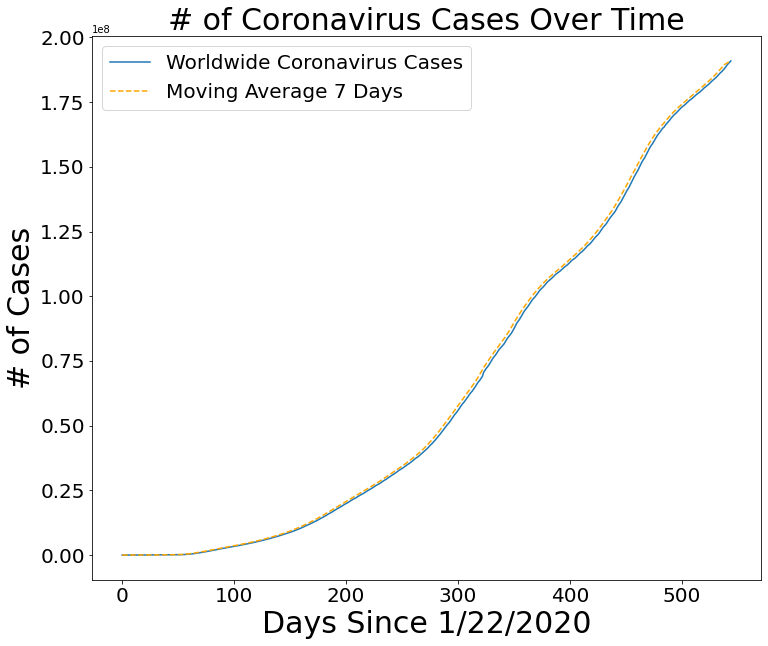

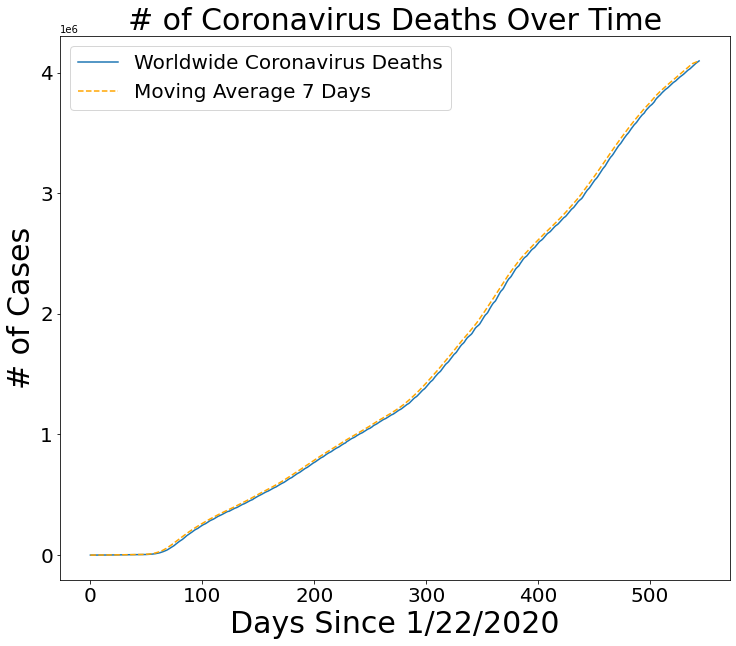

In [21]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(12, 10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()



plt.figure(figsize=(12, 10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

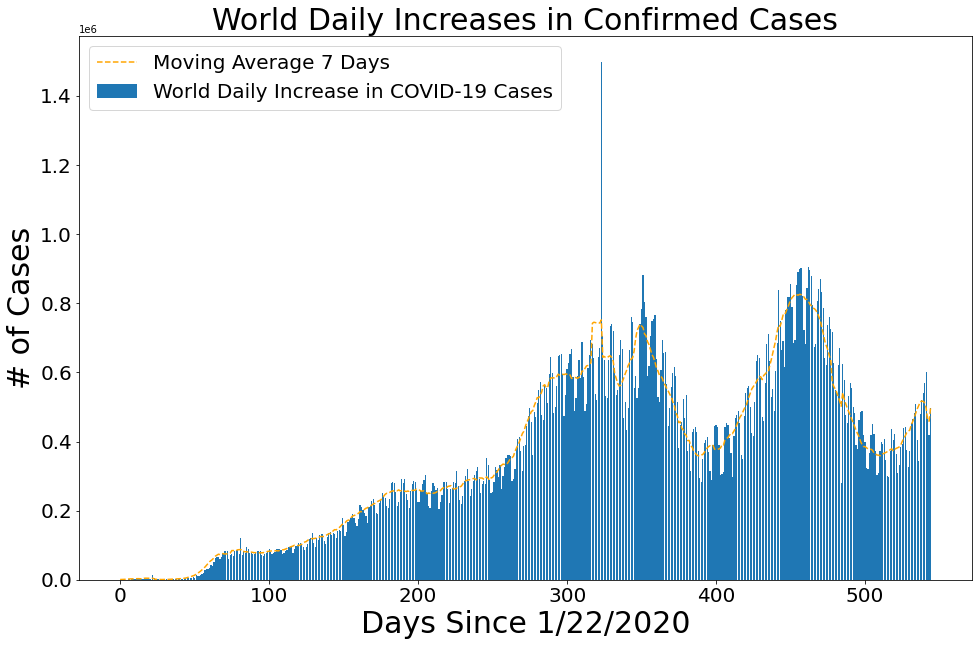

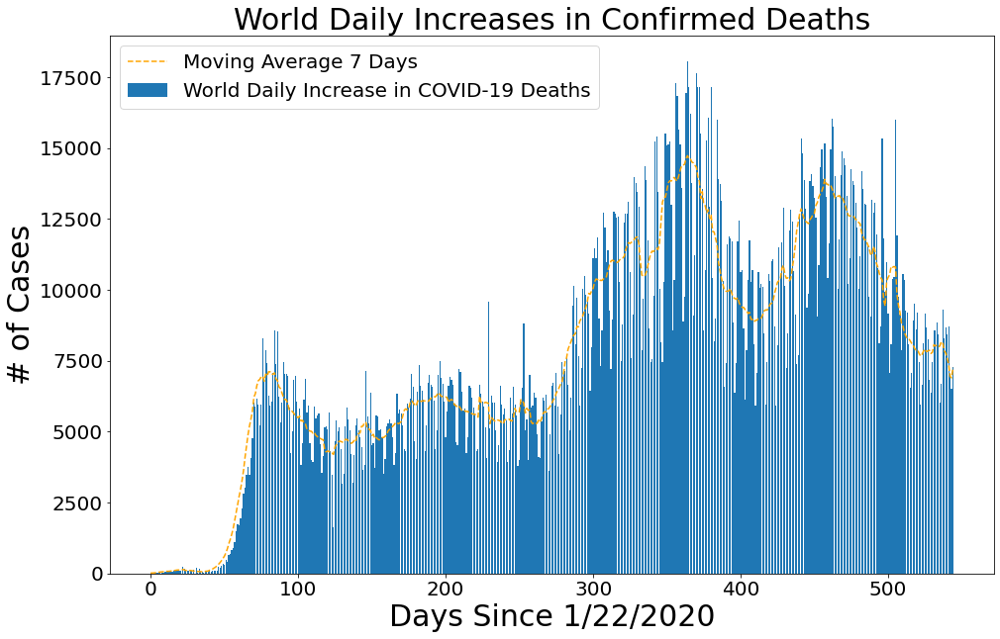

In [22]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

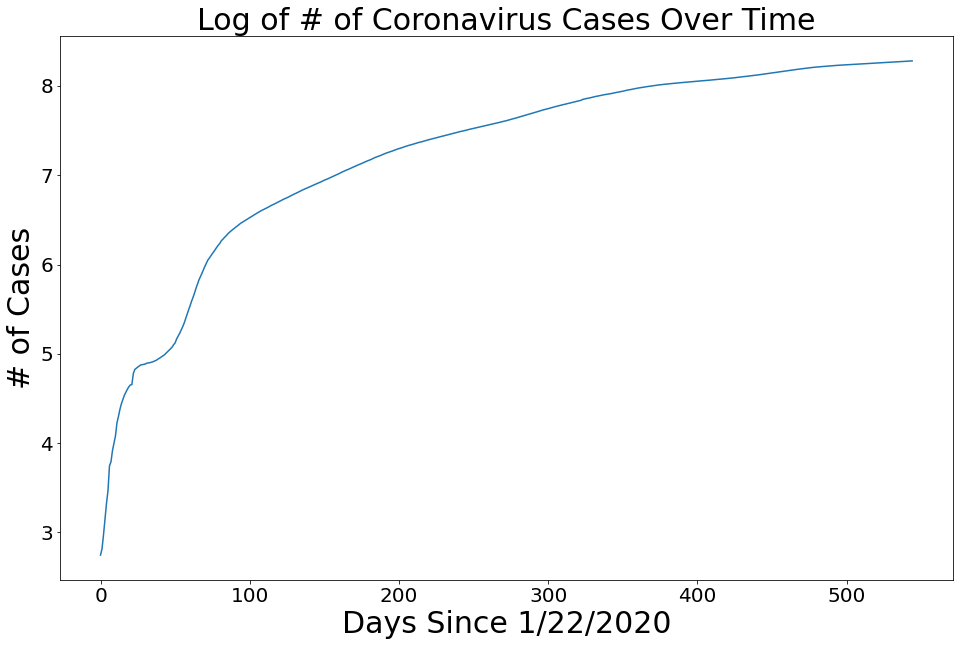

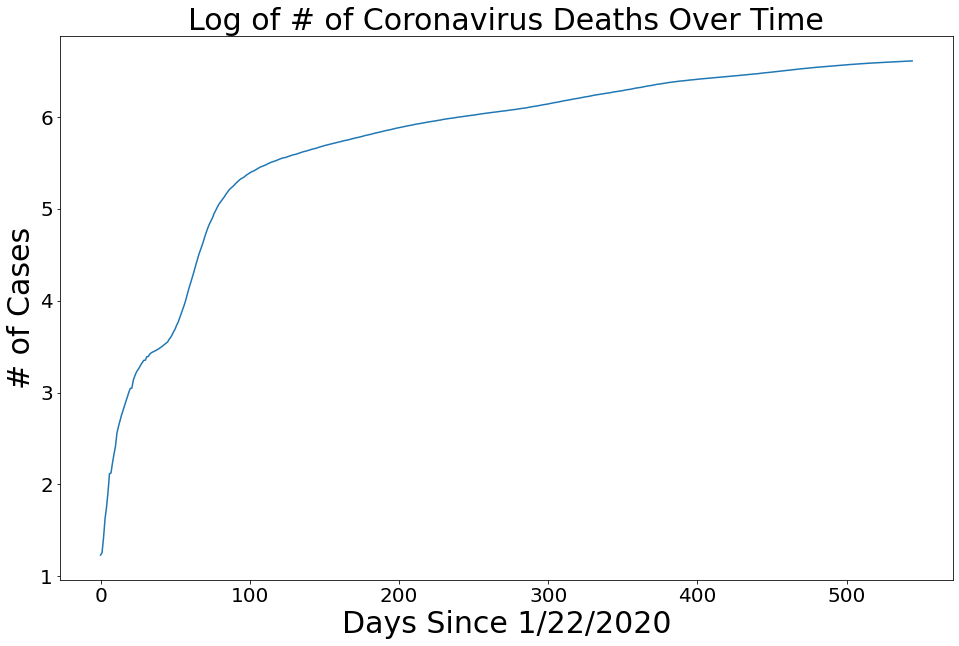

In [23]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# plt.figure(figsize=(16, 10))
# plt.plot(adjusted_dates, np.log10(total_recovered))
# plt.title('Log of # of Coronavirus Recoveries Over Time', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('# of Cases', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

In [24]:
def country_plot(x, y1, y2, y3, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
#     recovery_increase_avg = moving_average(y4, window)
    
    plt.figure(figsize=(16, 10))
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()


# helper function for getting country's cases, deaths, and recoveries        
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    
    for i in dates:
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][i].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][i].sum())
        
    return (country_cases, country_deaths)

    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
#     country_daily_recovery = daily_increase(country_recoveries)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_name)

# Country Specific Graphs
Unlike the previous section, we are taking a look at specific countries. This allows us to examine the pandemic at a local level. 
<a id='country_graphs'></a>

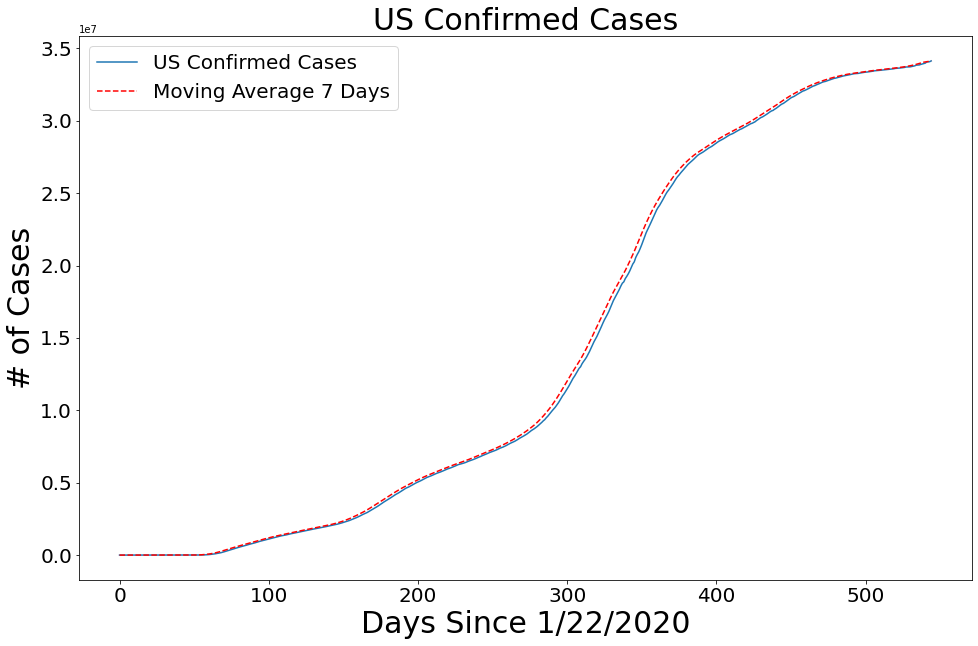

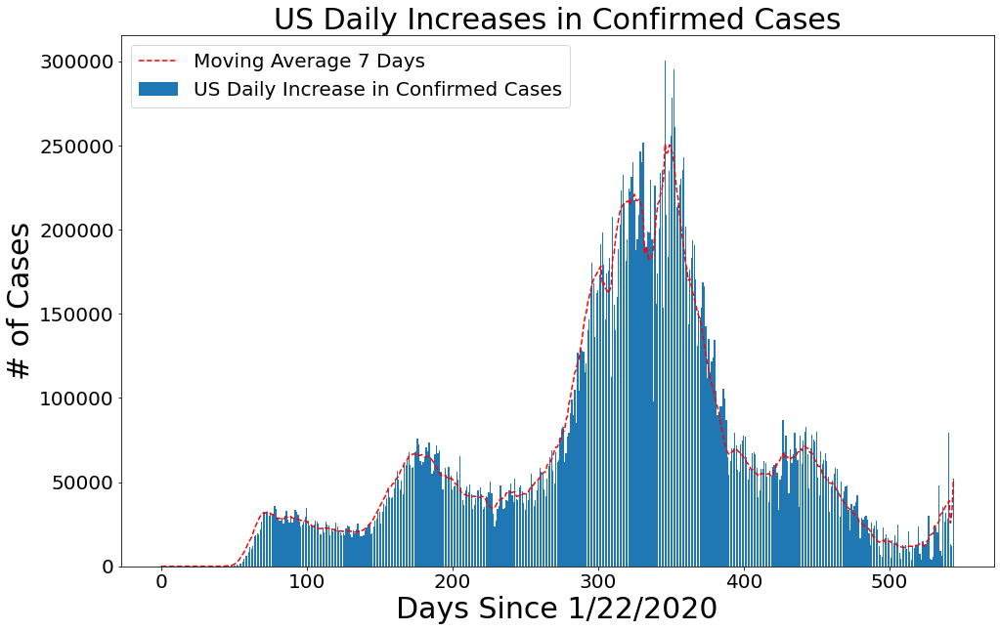

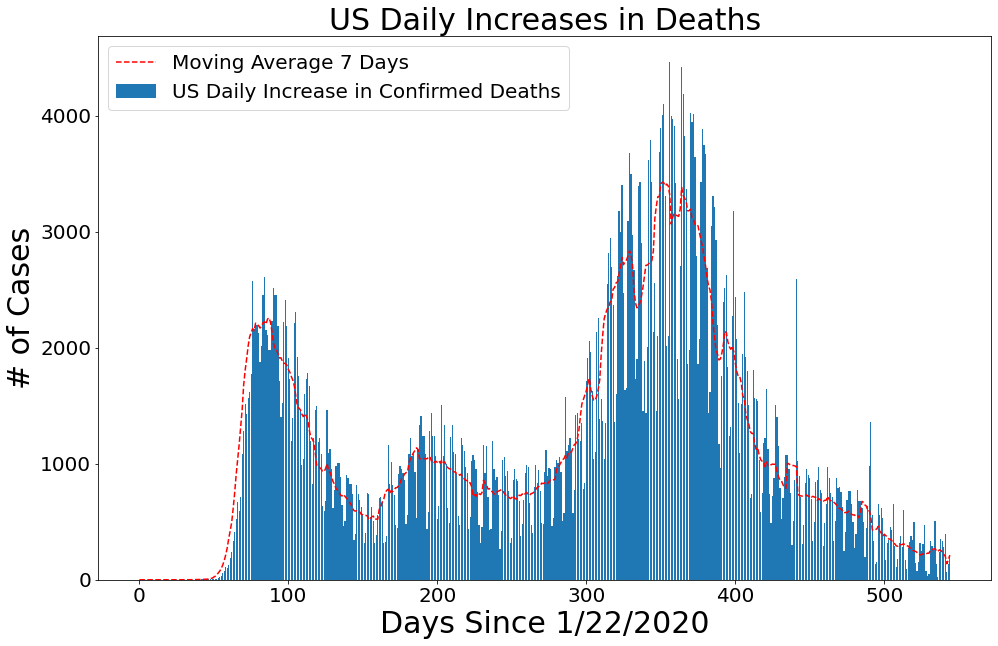

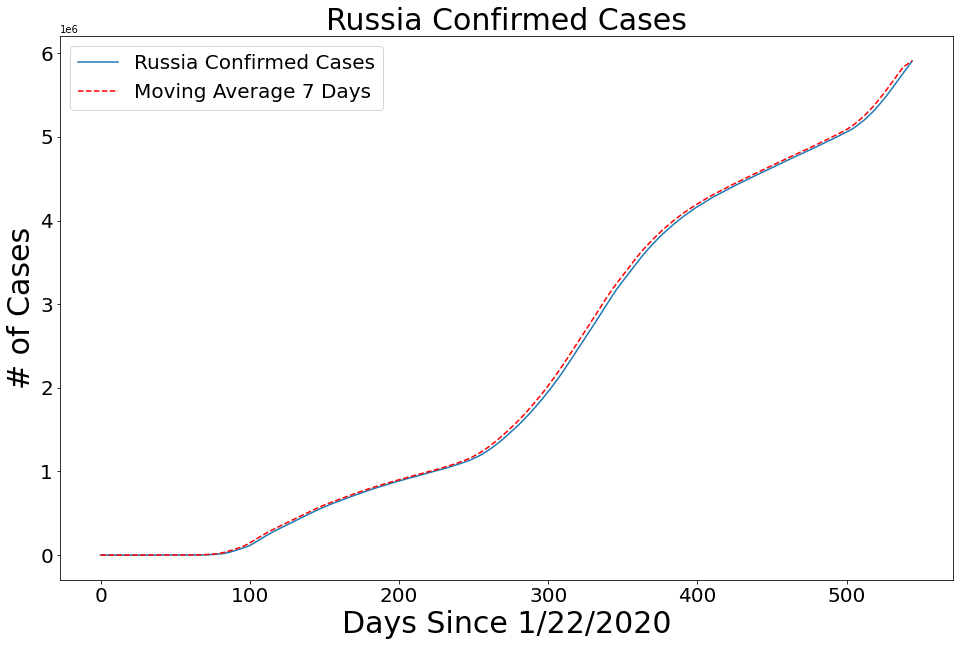

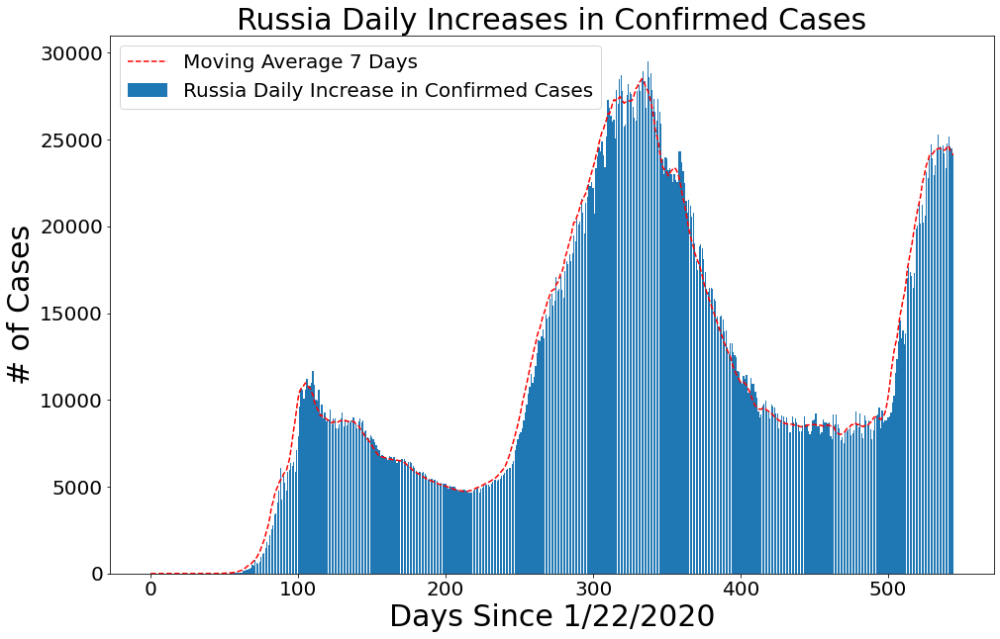

...

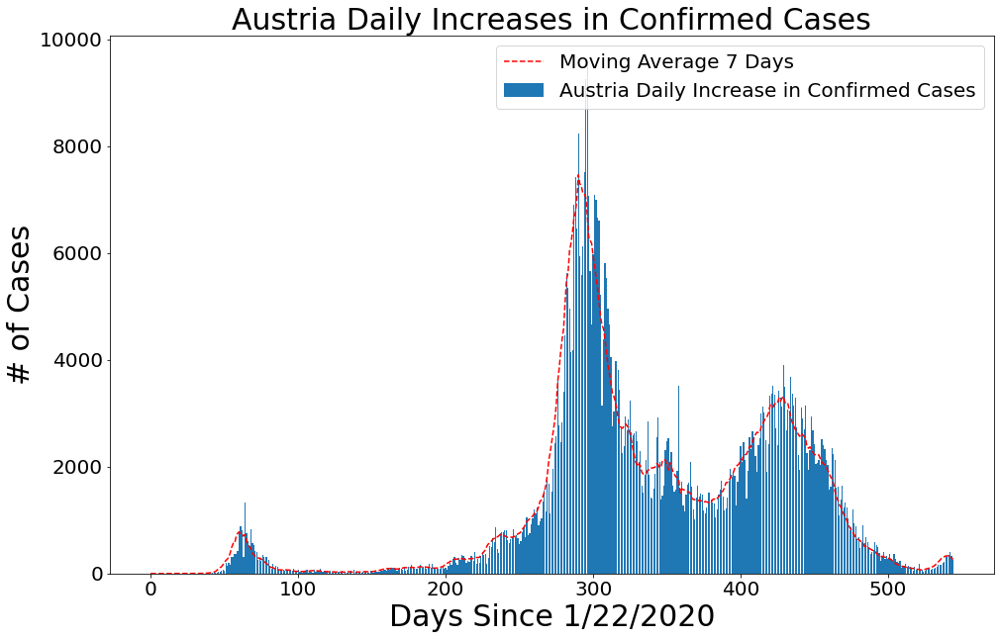

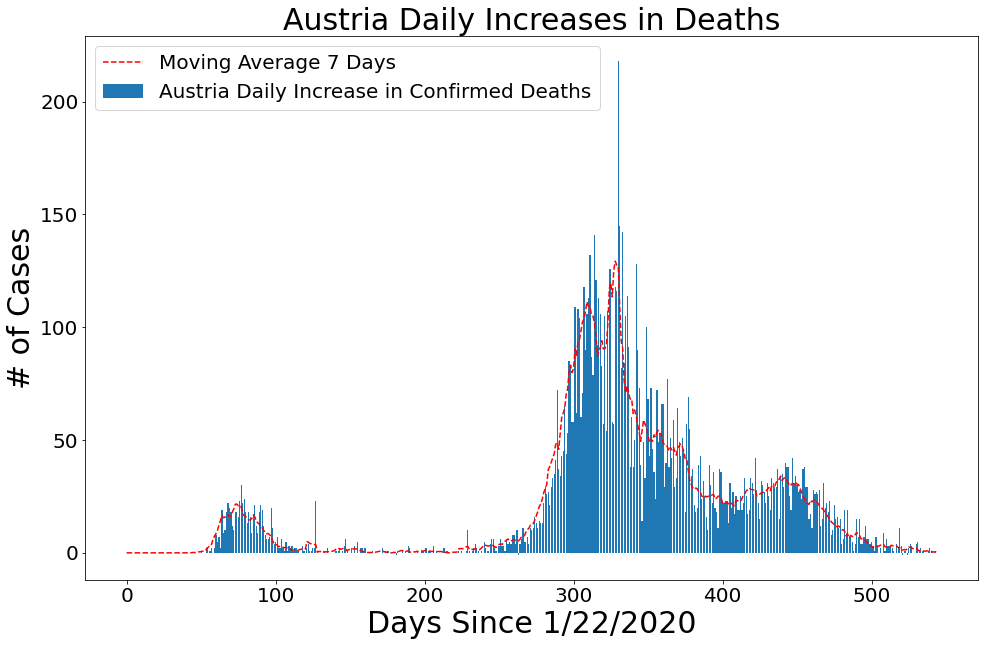

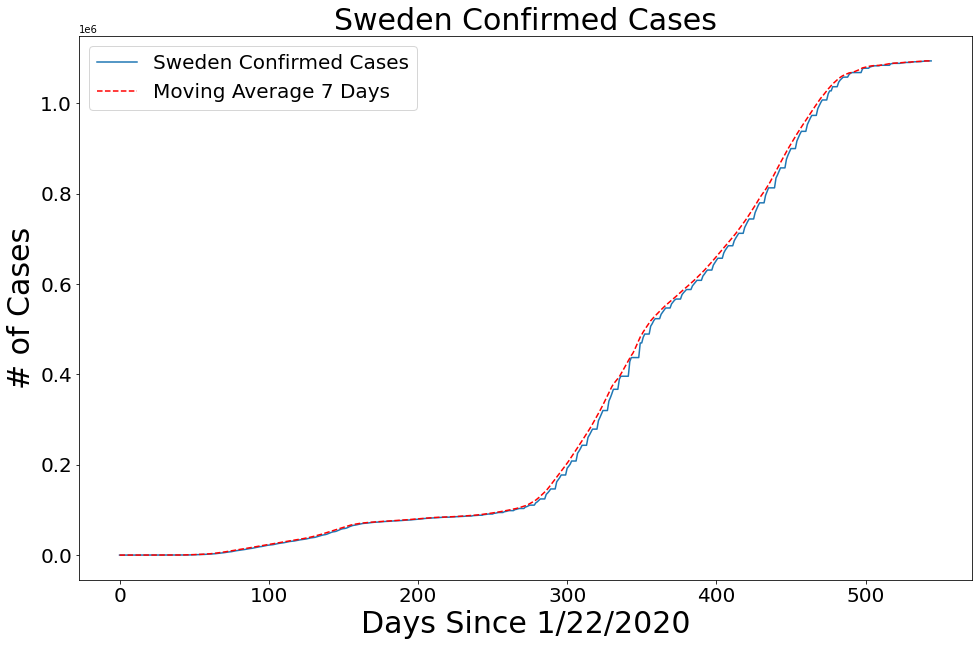

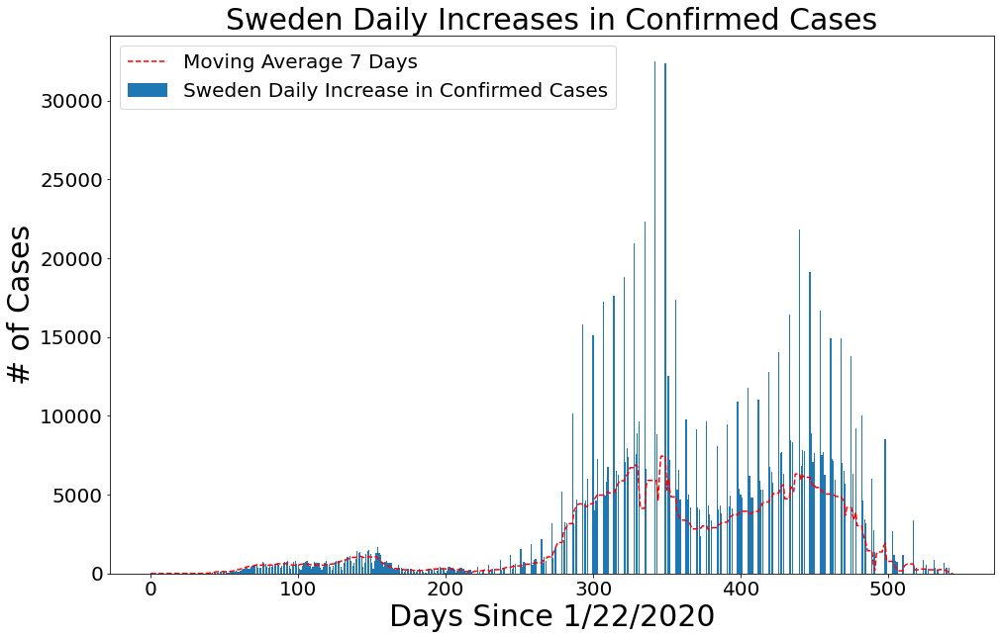

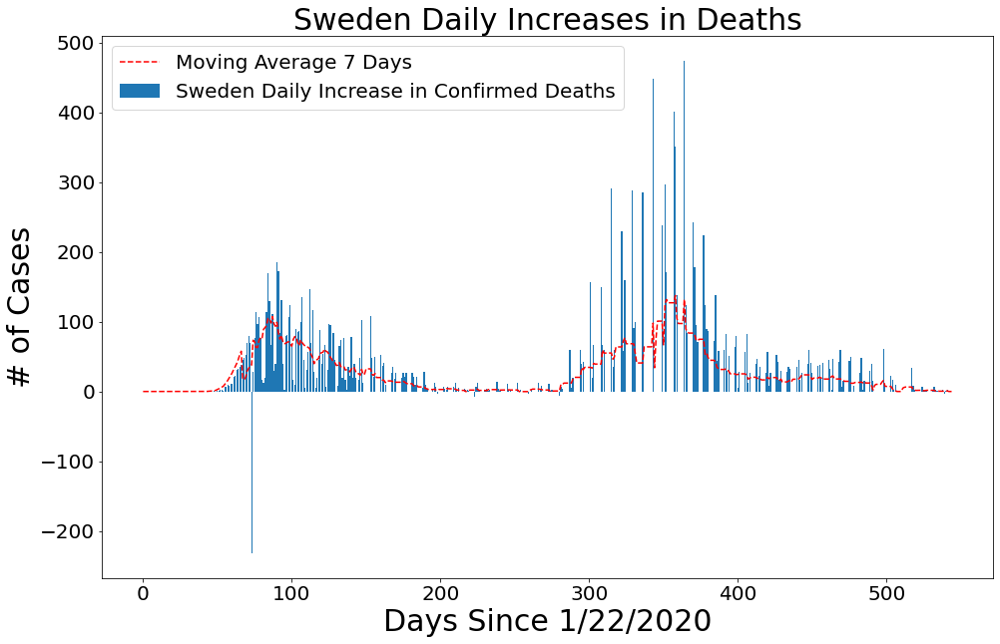

In [25]:
countries = ['US', 'Russia', 'India', 'Brazil', 'South Africa', 'China', 'Italy',
             'Germany', 'Spain', 'France', 'United Kingdom', 'Peru', 'Mexico', 'Colombia', 'Argentina', 'Saudi Arabia', 'Iran', 'Bangladesh',
            'Pakistan', 'Turkey', 'Philippines', 'Iraq', 'Indonesia', 'Israel', 'Ukraine', 'Ecuador', 'Bolivia', 'Netherlands', 'Belgium', 'Poland', 'Czechia', 'Switzerland',
            'Romania', 'Morocco','Portugal', 'Austria', 'Sweden'] 

for country in countries:
    country_visualizations(country)

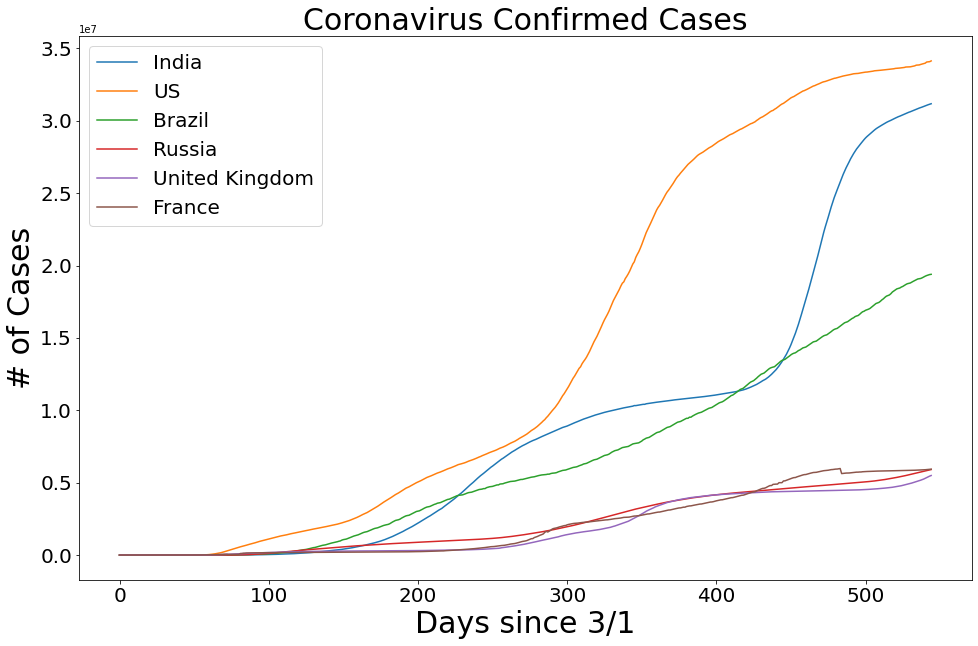

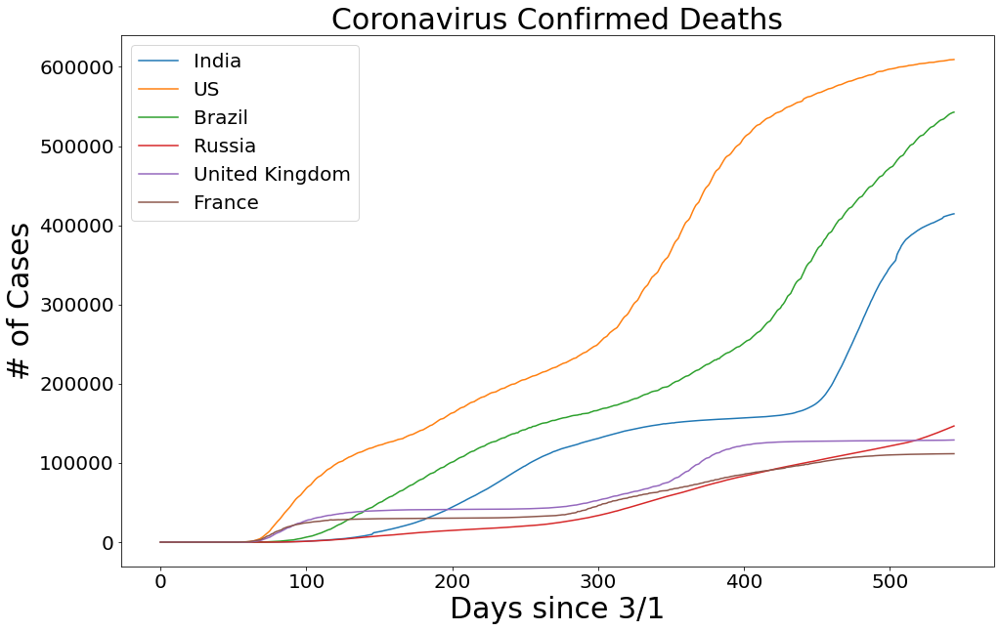

In [26]:
# Country Comparison
# removed redundant code

compare_countries = ['India', 'US', 'Brazil', 'Russia', 'United Kingdom', 'France'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths']

for num in range(2):
    plt.figure(figsize=(16, 10))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 3/1', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

In [27]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 10))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

Mortality Rate (worldwide) **susceptible to change **

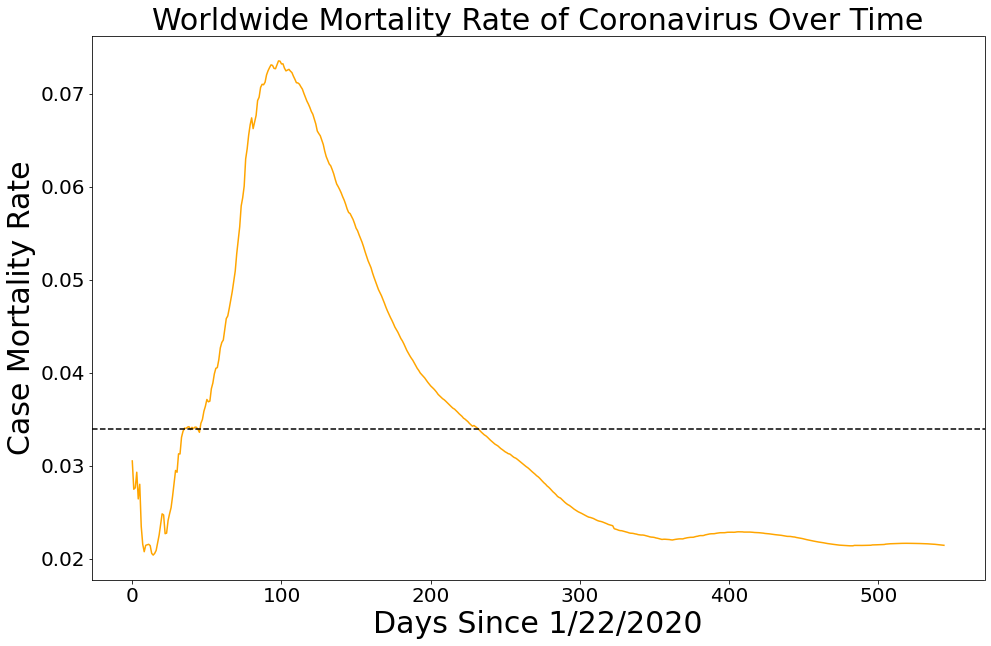

In [29]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

Recovery Rate (worldwide) **suceptible to change **

In [ ]:
# mean_recovery_rate = np.mean(recovery_rate)
# plt.figure(figsize=(16, 10))
# plt.plot(adjusted_dates, recovery_rate, color='blue')
# plt.title('Worldwide Recovery Rate of Coronavirus Over Time', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('Case Recovery Rate', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

Graphing deaths against recoveries

In [ ]:
# plt.figure(figsize=(16, 10))
# plt.plot(adjusted_dates, total_deaths, color='r')
# plt.plot(adjusted_dates, total_recovered, color='green')
# plt.legend(['death', 'recoveries'], loc='best', fontsize=25)
# plt.title('Worldwide Coronavirus Cases', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('# of Cases', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

Plotting the number of deaths against the number of recoveries. 

In [ ]:
# plt.figure(figsize=(16, 10))
# plt.plot(total_recovered, total_deaths)
# plt.title('# of Coronavirus Deaths vs. # of Coronavirus Recoveries', size=30)
# plt.xlabel('# of Coronavirus Recoveries', size=30)
# plt.ylabel('# of Coronavirus Deaths', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

Getting information about **countries/regions** that have confirmed coronavirus cases

In [32]:
latest_data

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-07-05 04:21:28,33.939110,67.709953,120216,4962,74480.0,40774.0,Afghanistan,308.813571,4.127570
1,NaN,NaN,NaN,Albania,2021-07-05 04:21:28,41.153300,20.168300,132535,2456,130027.0,52.0,Albania,4605.427757,1.853095
2,NaN,NaN,NaN,Algeria,2021-07-05 04:21:28,28.033900,1.659600,141471,3755,98387.0,39329.0,Algeria,322.617184,2.654254
3,NaN,NaN,NaN,Andorra,2021-07-05 04:21:28,42.506300,1.521800,13918,127,13721.0,70.0,Andorra,18013.330745,0.912487
4,NaN,NaN,NaN,Angola,2021-07-05 04:21:28,-11.202700,17.873900,39230,913,33669.0,4648.0,Angola,119.362503,2.327301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3982,NaN,NaN,NaN,Vietnam,2021-07-05 04:21:28,14.058324,108.277199,20261,86,7819.0,12356.0,Vietnam,20.814973,0.424461
3983,NaN,NaN,NaN,West Bank and Gaza,2021-07-05 04:21:28,31.952200,35.233200,314569,3573,308774.0,2222.0,West Bank and Gaza,6166.307551,1.135840
3984,NaN,NaN,NaN,Yemen,2021-07-05 04:21:28,15.552727,48.516388,6929,1361,4104.0,1464.0,Yemen,23.231434,19.642084
3985,NaN,NaN,NaN,Zambia,2021-07-05 04:21:28,-13.133897,27.849332,164282,2443,143128.0,18711.0,Zambia,893.616151,1.487077


In [33]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [34]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
# country_recovery_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
#     country_recovery_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Recovered'].sum())
    country_active_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Active'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

# Data table
<a id='data_table'></a>
This shows covid data for several countries. The table includes the number of confirmed cases, deaths, active cases, incidence rate, and mortality rate. 

In [35]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': [format(int(i), ',d') for i in country_confirmed_cases],
                          'Number of Deaths': [format(int(i), ',d') for i in country_death_cases], 
                          'Number of Active Cases' : [format(int(i), ',d') for i in country_active_cases], 'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})
# number of cases per country/region

country_df.style.background_gradient(cmap='Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,US,"33,717,761","605,613",0,32458679.185391,0.017961
1,India,"30,585,229","402,728","482,071",124415.063028,0.013167
2,Brazil,"18,769,808","524,417","1,662,908",281997.529622,0.027939
3,France,"5,848,209","111,348","5,330,811",62523.320904,0.019040
4,Russia,"5,544,209","135,637","398,679",306333.791535,0.024465
5,Turkey,"5,444,786","49,924","79,725",6450.590685,0.009169
6,United Kingdom,"4,920,168","128,486","4,775,908",60161.945780,0.026114
7,Argentina,"4,535,473","95,904","283,563",10035.169879,0.021145
8,Colombia,"4,350,495","108,896","194,453",224588.205840,0.025031
9,Italy,"4,263,317","127,649","44,664",147077.696491,0.029941


In [36]:
unique_provinces =  list(latest_data['Province_State'].unique())

Getting the latest information about **provinces/states** that have confirmed coronavirus cases

In [37]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
# province_recovery_cases = []
province_active = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
    province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [38]:
# nan_indices = [] 

# # handle nan if there is any, it is usually a float: float('nan')

# for i in range(len(unique_provinces)):
#     if type(unique_provinces[i]) == float:
#         nan_indices.append(i)

# unique_provinces = list(unique_provinces)
# province_confirmed_cases = list(province_confirmed_cases)

# for i in nan_indices:
#     unique_provinces.pop(i)
#     province_confirmed_cases.pop(i)

In [39]:
# number of cases per province/state/city top 100 
province_limit = 100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': [format(int(i), ',d') for i in province_confirmed_cases[:province_limit]],
                          'Number of Deaths': [format(int(i), ',d') for i in province_death_cases[:province_limit]],'Number of Active Cases' : [format(int(i), ',d') for i in province_active[:province_limit]], 
                            'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,India,"6,098,177","123,030","126,454",4952.060967,0.020175
1,England,United Kingdom,"4,259,710","112,762","4,146,948",7609.723244,0.026472
2,California,US,"3,820,921","63,650",0,469384.363017,0.016658
3,Sao Paulo,Brazil,"3,785,859","129,609","325,723",8244.637209,0.034235
4,Texas,US,"3,004,684","52,482",0,2710366.122757,0.017467
5,Kerala,India,"2,973,684","13,716","104,508",8329.777022,0.004612
6,Karnataka,India,"2,853,643","35,367","44,869",4223.696790,0.012394
7,Tamil Nadu,India,"2,496,287","33,005","35,294",3206.894102,0.013222
8,Florida,US,"2,381,148","37,985",0,703345.209436,0.015952
9,New York,US,"2,116,516","53,701",0,517282.217180,0.025372


In [40]:
# return the data table with province/state info for a given country
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
    state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
        state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': [format(int(i), ',d') for i in state_confirmed_cases],
                              'Number of Deaths': [format(int(i), ',d') for i in state_death_cases], 'Number of Active Cases' : [format(int(i), ',d') for i in state_active], 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})
    # number of cases per country/region
    return state_df

Data table for **India**

In [41]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Maharashtra,"6,098,177","123,030","126,454",4952.060967,0.020175
1,Kerala,"2,973,684","13,716","104,508",8329.777022,0.004612
2,Karnataka,"2,853,643","35,367","44,869",4223.696790,0.012394
3,Tamil Nadu,"2,496,287","33,005","35,294",3206.894102,0.013222
4,Andhra Pradesh,"1,902,923","12,844","35,325",3530.247159,0.006750
5,Uttar Pradesh,"1,706,621","22,640","2,264",717.421158,0.013266
6,West Bengal,"1,505,394","17,799","18,780",1511.298598,0.011823
7,Delhi,"1,434,554","24,995",992,7666.933783,0.017424
8,Chhattisgarh,"995,718","13,456","5,345",3382.627348,0.013514
9,Rajasthan,"952,734","8,938","1,180",1175.740324,0.009381


Data table for the **United States**

In [42]:
us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,California,"3,820,921","63,650",0,469384.363017,0.016658
1,Texas,"3,004,684","52,482",0,2710366.122757,0.017467
2,Florida,"2,381,148","37,985",0,703345.209436,0.015952
3,New York,"2,116,516","53,701",0,517282.217180,0.025372
4,Illinois,"1,392,552","25,678",0,1180227.199667,0.018440
5,Pennsylvania,"1,217,389","27,706",0,640099.125306,0.022759
6,Georgia,"1,135,526","21,443",0,1678589.617132,0.018884
7,Ohio,"1,112,289","20,431",0,821651.886103,0.018368
8,New Jersey,"1,024,225","26,473",0,231364.860032,0.025847
9,North Carolina,"1,014,359","13,434",0,975658.430872,0.013244


Data table for **Brazil**

In [43]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Sao Paulo,"3,785,859","129,609","325,723",8244.637209,0.034235
1,Minas Gerais,"1,827,108","47,079","85,282",8631.140059,0.025767
2,Parana,"1,302,708","31,418","356,271",11393.326038,0.024117
3,Rio Grande do Sul,"1,230,739","31,709","13,448",10817.554241,0.025764
4,Bahia,"1,137,167","24,259","12,016",7645.815281,0.021333
5,Santa Catarina,"1,062,080","17,014","18,653",14823.606784,0.016020
6,Rio de Janeiro,"966,114","56,031","8,817",5595.813435,0.057996
7,Ceara,"892,698","22,747","243,937",9775.409277,0.025481
8,Goias,"682,753","19,400","11,507",9728.107189,0.028414
9,Pernambuco,"558,698","17,872","65,546",5845.912414,0.031989


Data table for **Russia**

In [44]:
russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Moscow,"1,387,775","22,895","182,340",11096.458249,0.016498
1,Saint Petersburg,"476,452","16,776","5,224",8902.425011,0.035210
2,Moscow Oblast,"324,604","6,590","55,676",4326.100820,0.020302
3,Nizhny Novgorod Oblast,"126,446","4,319","5,056",3908.985913,0.034157
4,Rostov Oblast,"100,318","4,702","5,122",2376.949199,0.046871
5,Sverdlovsk Oblast,"95,152","3,903","2,603",2199.916028,0.041019
6,Voronezh Oblast,"91,888","3,226","1,627",3937.323676,0.035108
7,Krasnoyarsk Krai,"78,770","3,993","4,054",2738.400214,0.050692
8,Irkutsk Oblast,"75,207","2,841","3,054",3128.157242,0.037776
9,Samara Oblast,"68,364","2,326",886,2140.713960,0.034024


Data table for **United Kingdom**

In [45]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,England,"4,259,710","112,762","4,146,948",7609.723244,0.026472
1,Scotland,"295,113","7,729","287,384",5401.735215,0.026190
2,Wales,"219,831","5,575","214,256",7004.110113,0.025360
3,Northern Ireland,"128,780","2,156","126,624",6844.175170,0.016742
4,Unknown,"63,474","27,524","-4,005,123",0.000000,0.433626
5,Channel Islands,"4,521",86,441,2651.628455,0.019022
6,Gibraltar,"4,366",94,32,12958.950462,0.021530
7,Bermuda,"2,516",33,12,4040.274276,0.013116
8,Turks and Caicos Islands,"2,425",18,9,6263.236737,0.007423
9,Isle of Man,"1,638",29,38,1926.333616,0.017705


Data table for **France**

In [46]:
france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Reunion,"30,583",237,"1,761",3415.919438,0.007749
1,French Guiana,"27,628",146,"17,487",9249.971542,0.005284
2,Mayotte,"19,412",174,"16,274",7115.496696,0.008964
3,French Polynesia,"19,011",142,14,6767.792555,0.007469
4,Guadeloupe,"17,539",267,"15,022",4383.358284,0.015223
5,Martinique,"12,286",98,"12,090",3273.953073,0.007977
6,St Martin,"2,314",37,878,5985.669572,0.015990
7,Saint Barthelemy,"1,005",1,542,10166.919575,0.000995
8,Wallis and Futuna,445,7,0,2910.589313,0.015730
9,New Caledonia,129,0,71,45.185312,0.000000


Data table for **Italy**

In [47]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Lombardia,"842,375","33,786","8,976",8373.031201,0.040108
1,Veneto,"425,654","11,619","4,570",8676.450624,0.027297
2,Campania,"424,766","7,504","7,583",7321.415890,0.017666
3,Emilia-Romagna,"387,048","13,264","2,593",8679.224044,0.034270
4,Piemonte,"363,044","11,696",777,8333.566706,0.032216
5,Lazio,"346,269","8,349","2,773",5889.848109,0.024111
6,Puglia,"253,496","6,644","2,660",6291.701797,0.026209
7,Toscana,"244,484","6,875","1,567",6555.161743,0.028120
8,Sicilia,"232,184","5,981","3,563",4643.781234,0.025760
9,Friuli Venezia Giulia,"106,996","3,789",186,8804.660884,0.035413


Data table for **Spain**

In [48]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Madrid,"733,770","15,458","677,576",11048.009312,0.021067
1,Catalonia,"658,025","14,739","617,083",8696.636499,0.022399
2,Andalusia,"622,814","10,067","602,076",7390.341392,0.016164
3,C. Valenciana,"405,365","7,416","387,979",8148.090973,0.018295
4,Castilla y Leon,"237,779","6,927","222,136",9875.638204,0.029132
5,Pais Vasco,"205,405","4,544","184,701",9431.419546,0.022122
6,Castilla - La Mancha,"197,060","6,012","184,656",9684.123414,0.030508
7,Galicia,"130,493","2,423","118,866",4832.284801,0.018568
8,Aragon,"127,350","3,553","120,025",9643.446167,0.027899
9,Murcia,"115,175","1,606","111,389",7742.008775,0.013944


Data table for **Germany**

In [49]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,"816,833","17,166","2,767",4555.004165,0.021015
1,Bayern,"647,993","15,273","2,220",4955.317162,0.023570
2,Baden-Wurttemberg,"501,259","10,279","2,180",4528.275944,0.020506
3,Hessen,"291,195","7,542","1,153",4647.364770,0.025900
4,Sachsen,"285,943","10,087",556,7011.952367,0.035276
5,Niedersachsen,"261,217","5,769",748,3272.392128,0.022085
6,Berlin,"180,275","3,559",216,4946.052294,0.019742
7,Rheinland-Pfalz,"155,336","3,893",943,3802.740080,0.025062
8,Thuringen,"128,804","4,340",364,6010.045984,0.033695
9,Brandenburg,"108,718","3,807",311,4328.088866,0.035017


Data table for **the Netherlands**

In [50]:
netherlands_table = country_table('Netherlands')
netherlands_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Zuid-Holland,"403,145","4,285","398,860",10870.262755,0.010629
1,Noord-Holland,"279,179","2,627","276,552",9695.307597,0.009410
2,Noord-Brabant,"273,586","3,140","270,446",10674.631431,0.011477
3,Gelderland,"189,173","2,028","187,145",9068.904749,0.010720
4,Limburg,"177,032","1,654","175,378",17370.530238,0.009343
5,Utrecht,"128,909","1,280","127,629",9514.744980,0.009929
6,Overijssel,"110,620","1,141","109,479",9516.468428,0.010315
7,Unknown,"63,474","27,524","-4,005,123",0.000000,0.433626
8,Friesland,"43,885",478,"43,407",6751.985131,0.010892
9,Groningen,"39,540",263,"39,277",6748.983556,0.006651


Data table for **China**

In [51]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Hubei,"68,162","4,512",2,115.196890,0.066195
1,Unknown,"63,474","27,524","-4,005,123",0.000000,0.433626
2,Hong Kong,"11,942",211,94,159.290638,0.017669
3,Guangdong,"2,756",8,123,2.429050,0.002903
4,Shanghai,"2,218",7,50,9.150165,0.003156
5,Heilongjiang,"1,612",13,0,4.272462,0.008065
6,Zhejiang,"1,386",1,48,2.415897,0.000722
7,Hebei,"1,317",7,0,1.742986,0.005315
8,Henan,"1,317",22,4,1.371161,0.016705
9,Sichuan,"1,109",3,46,1.329577,0.002705


Data table for **Colombia**

In [52]:
colombia_table = country_table('Colombia')
colombia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Capital District,"1,291,549","24,258","80,826",17423.777407,0.018782
1,Antioquia,"657,291","14,093","34,276",10258.787826,0.021441
2,Amazonas,"440,140","14,740","72,556",25077.598134,0.033489
3,Valle del Cauca,"338,608","10,524","11,514",7565.161400,0.031080
4,Atlantico,"293,968","9,025","4,618",11594.006272,0.030701
5,Cundinamarca,"228,447","5,888","8,522",7826.046741,0.025774
6,Santander,"198,957","6,215","8,869",9106.262847,0.031238
7,Bolivar,"135,604","2,560","3,476",6550.569776,0.018878
8,Tolima,"92,830","2,990","2,779",6978.718030,0.032209
9,Boyaca,"92,202","2,144","3,766",7573.830928,0.023253


Data table for **Mexico**

In [53]:
mexico_table = country_table('Mexico')
mexico_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Ciudad de Mexico,"691,748","34,761","656,987",7670.198794,0.050251
1,Mexico,"261,133","37,453","223,680",1498.371279,0.143425
2,Guanajuato,"133,176","11,116","122,060",2138.282884,0.083468
3,Nuevo Leon,"128,075","9,770","118,305",2282.914566,0.076283
4,Jalisco,"89,402","12,712","76,690",1063.082802,0.142189
5,Puebla,"86,563","12,317","74,246",1310.676694,0.142289
6,Sonora,"80,439","6,803","73,636",2616.119386,0.084573
7,Tabasco,"78,021","4,298","73,723",3033.137438,0.055088
8,Queretaro,"69,973","4,471","65,502",3069.479922,0.063896
9,Coahuila,"69,758","6,426","63,332",2167.259035,0.092118


<a id='bar_charts'></a>
# Bar Chart Visualizations for COVID-19
This offers us some insights for how different countries/regions compare in terms of covid cases.

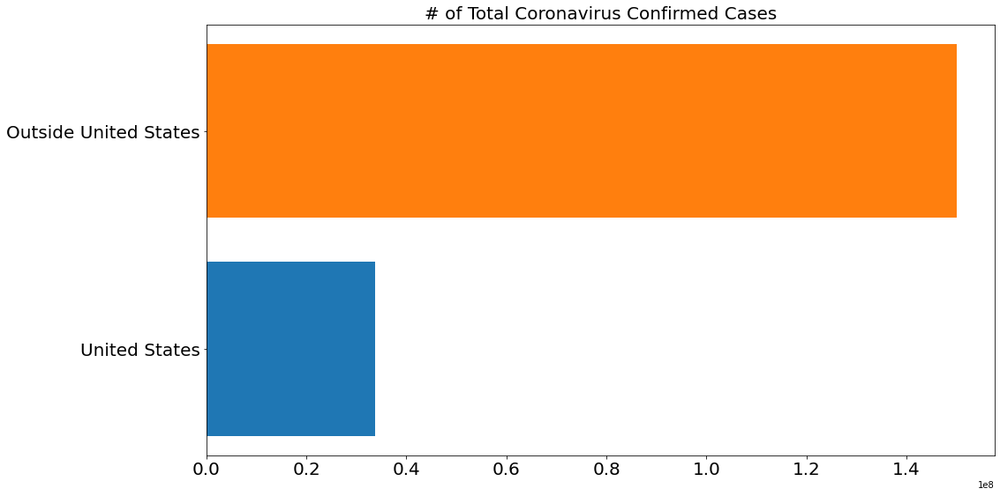

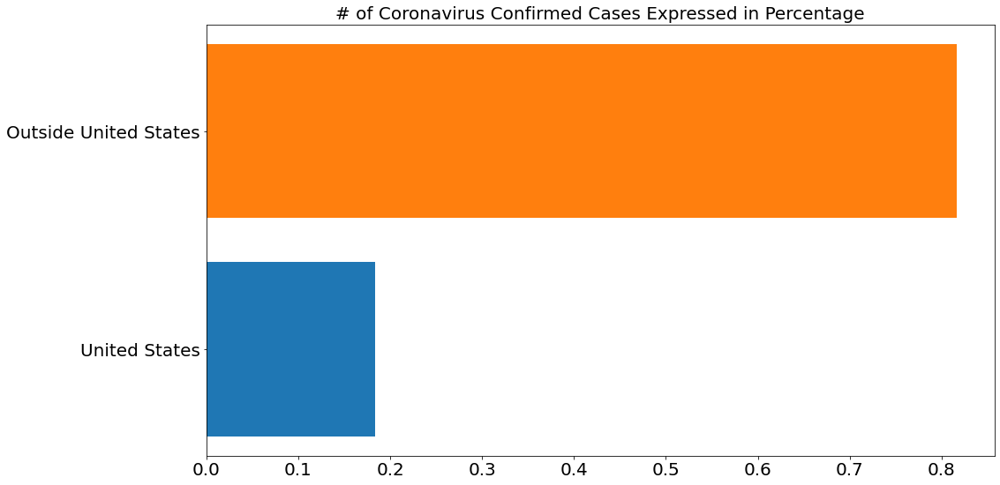

In [54]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [55]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 150069205 cases (81.7%):
United States 33717761 cases (18.3%)
Total: 183786966 cases


In [56]:
# Only show 10 countries with the most confirmed cases, the rest are grouped into the other category
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)

In [57]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    
# good for a lot x values 
def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

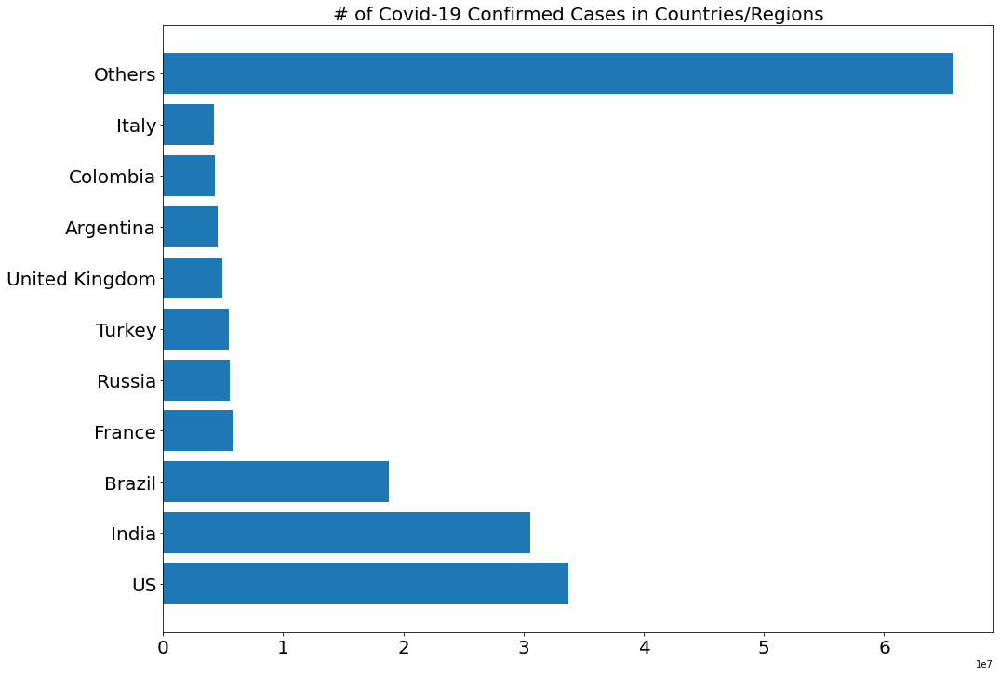

In [58]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

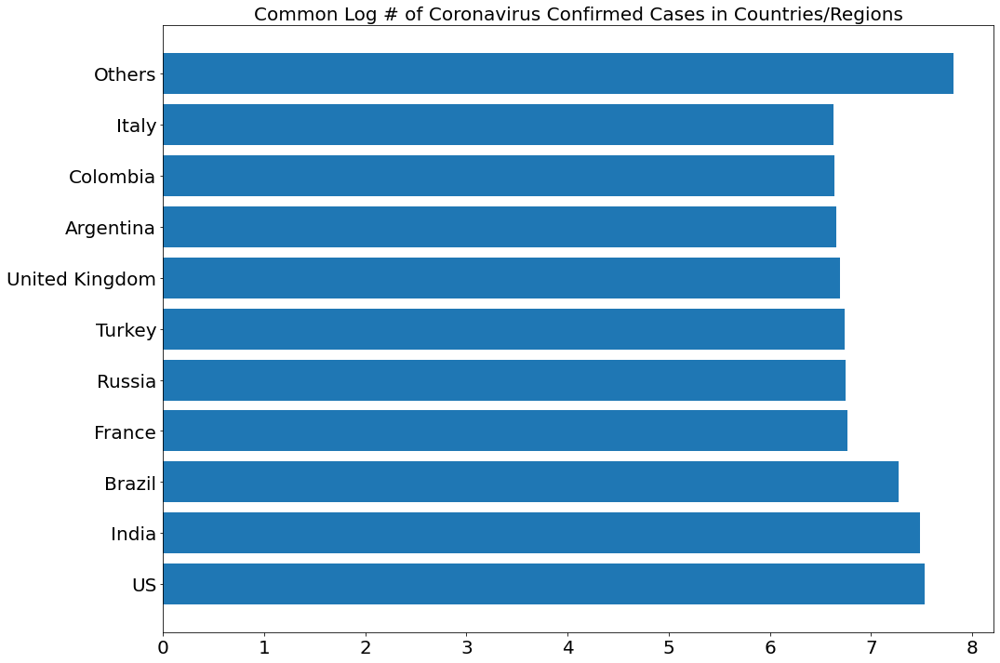

In [59]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [60]:
# Only show 10 provinces with the most confirmed cases, the rest are grouped into the other category
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

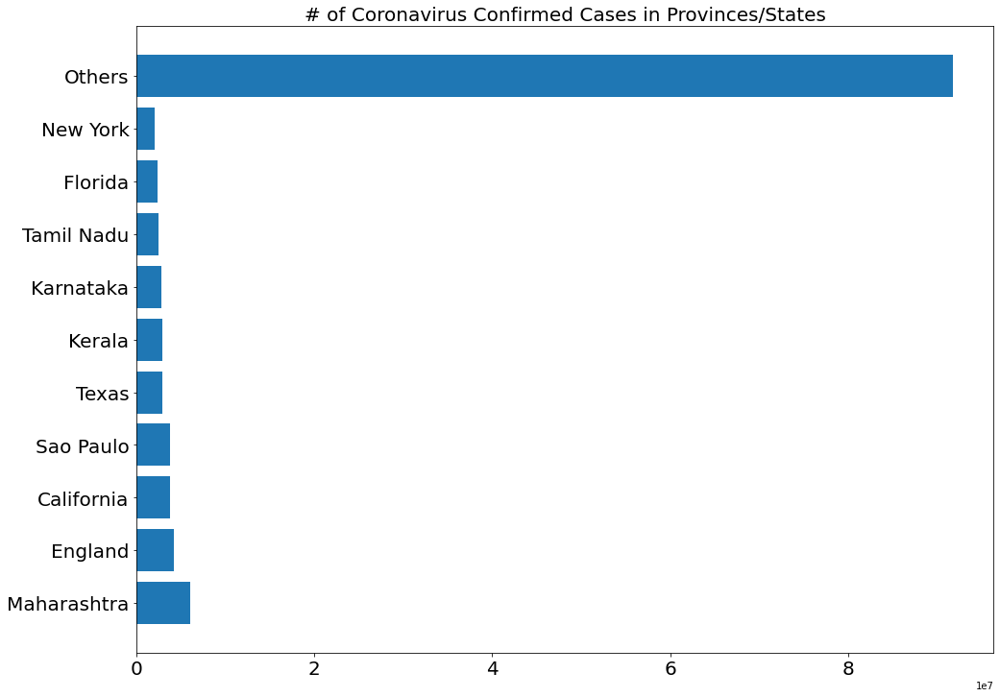

In [61]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

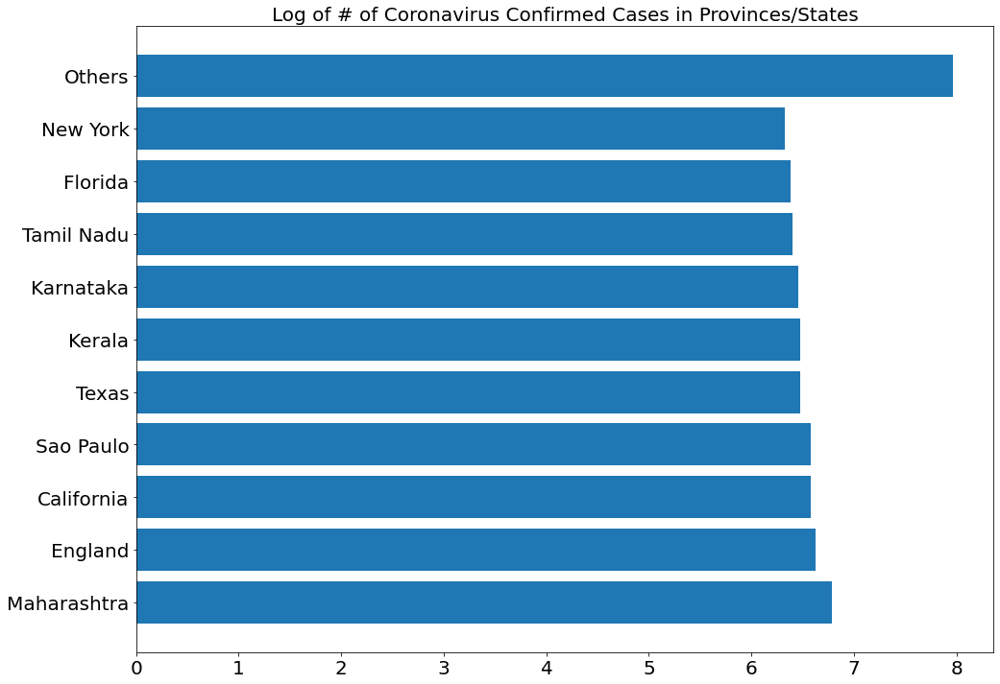

In [62]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

<a id='pie_charts'></a>
# Pie Chart Visualizations for COVID-19
Although pie charts are not necessarily the most informative visualizations, I added them to increase some variety for the visualizations. 

In [63]:
def plot_pie_charts(x, y, title):
    # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True, labels=y)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

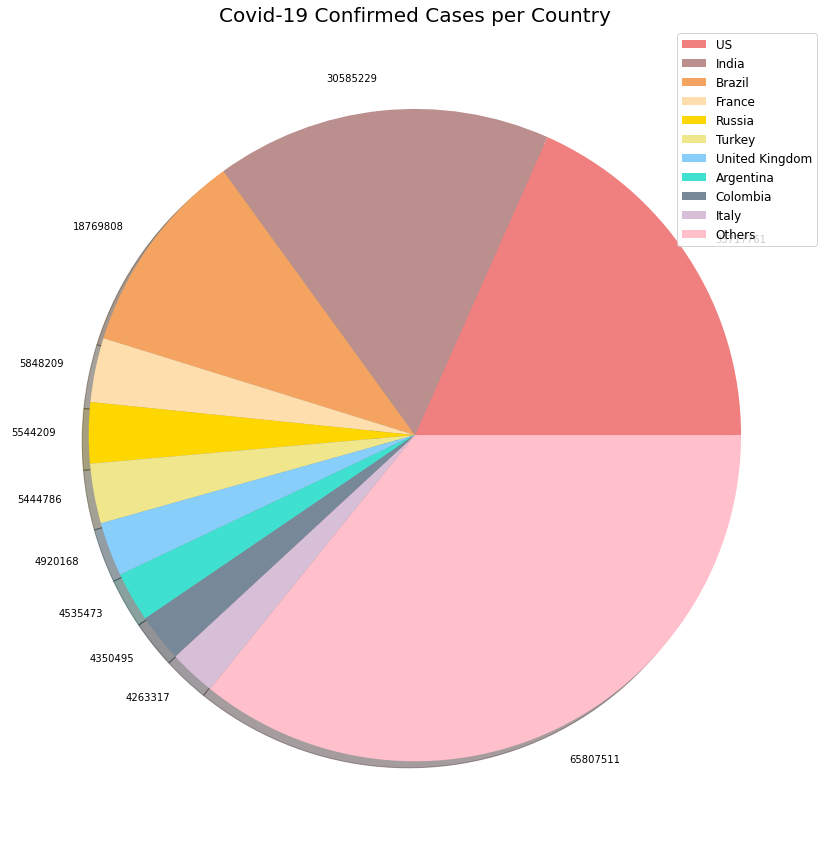

In [64]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

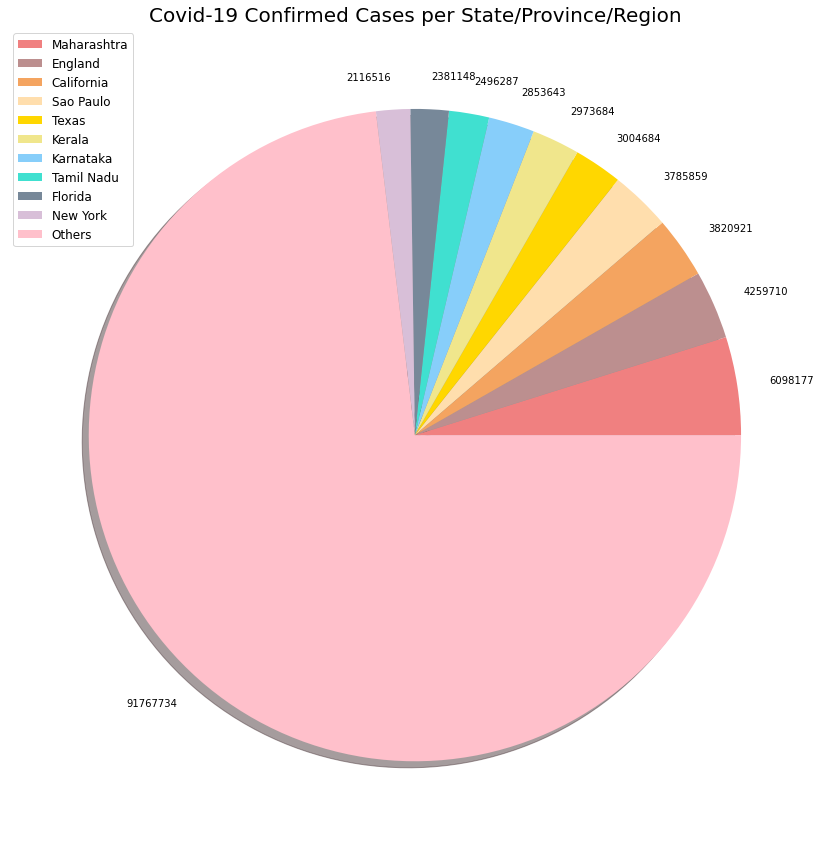

In [65]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [66]:
# Plotting countries with regional data using a pie chart 

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    # only show the top 5 states
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
    
    # additional province/state will be considered "others"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

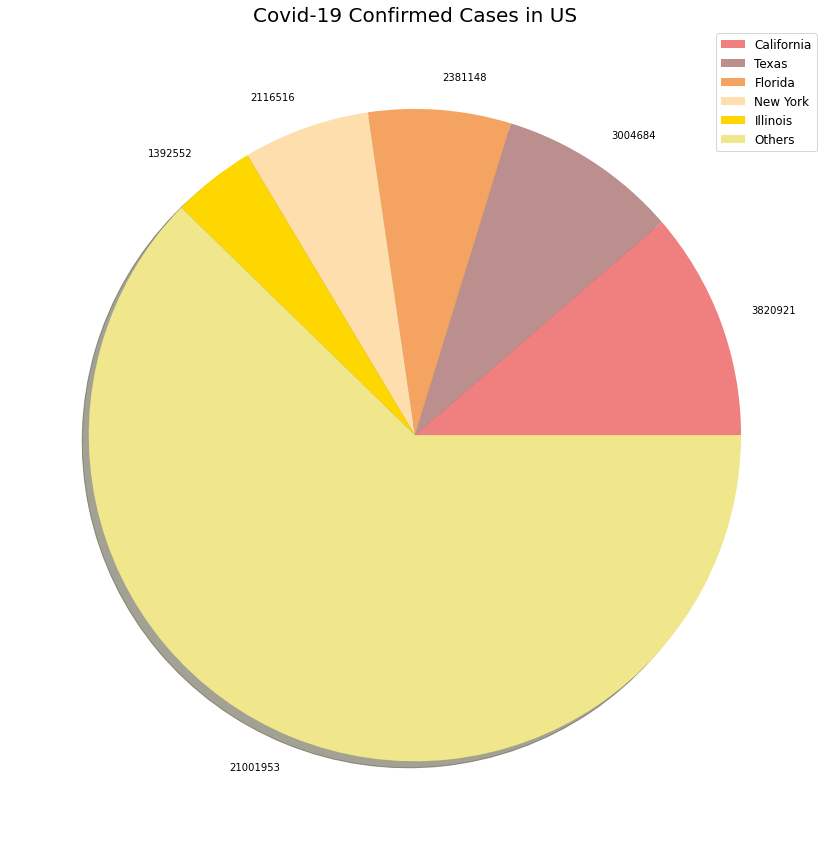

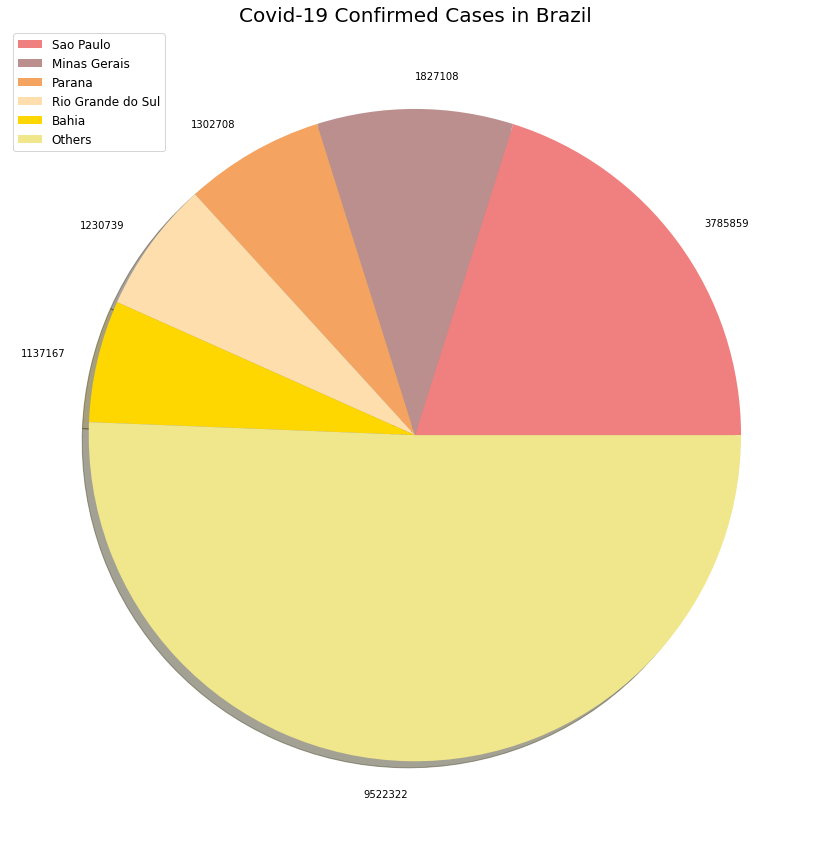

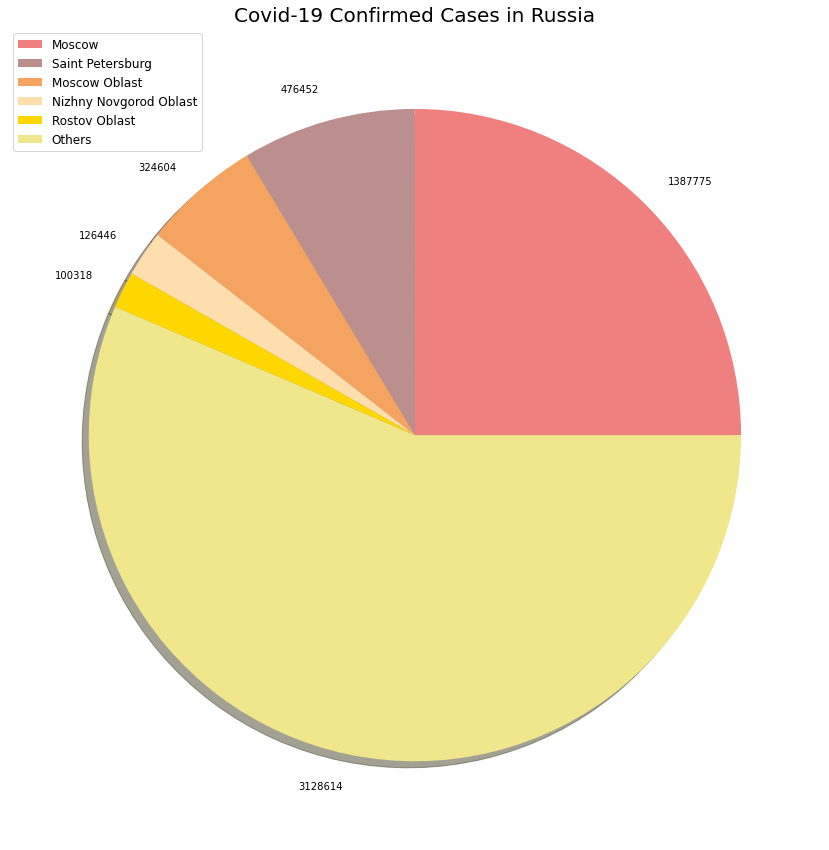

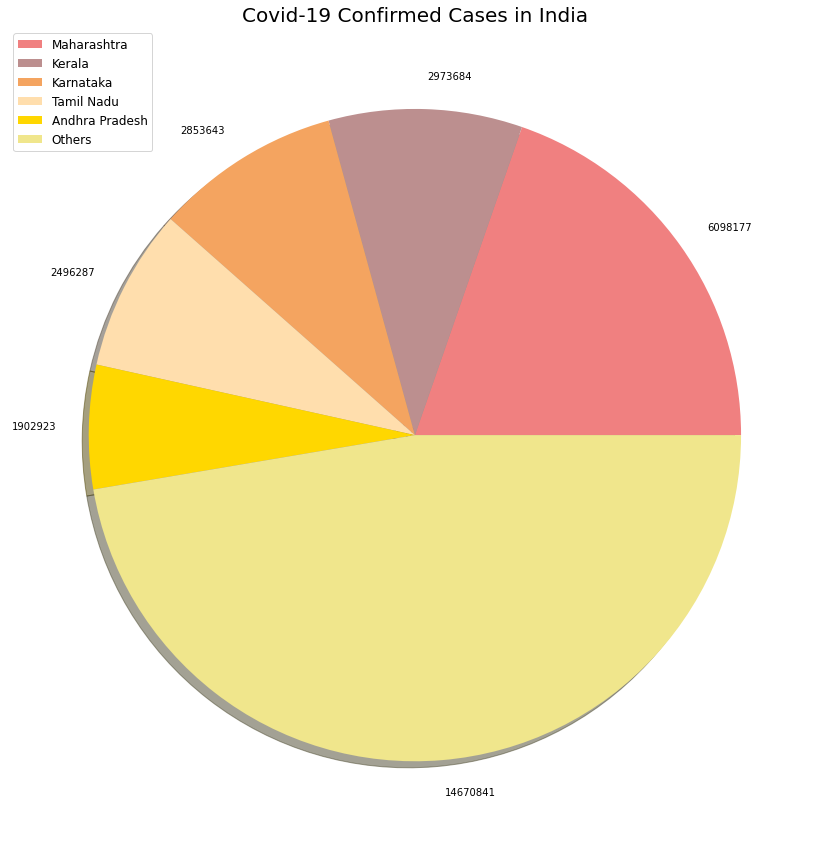

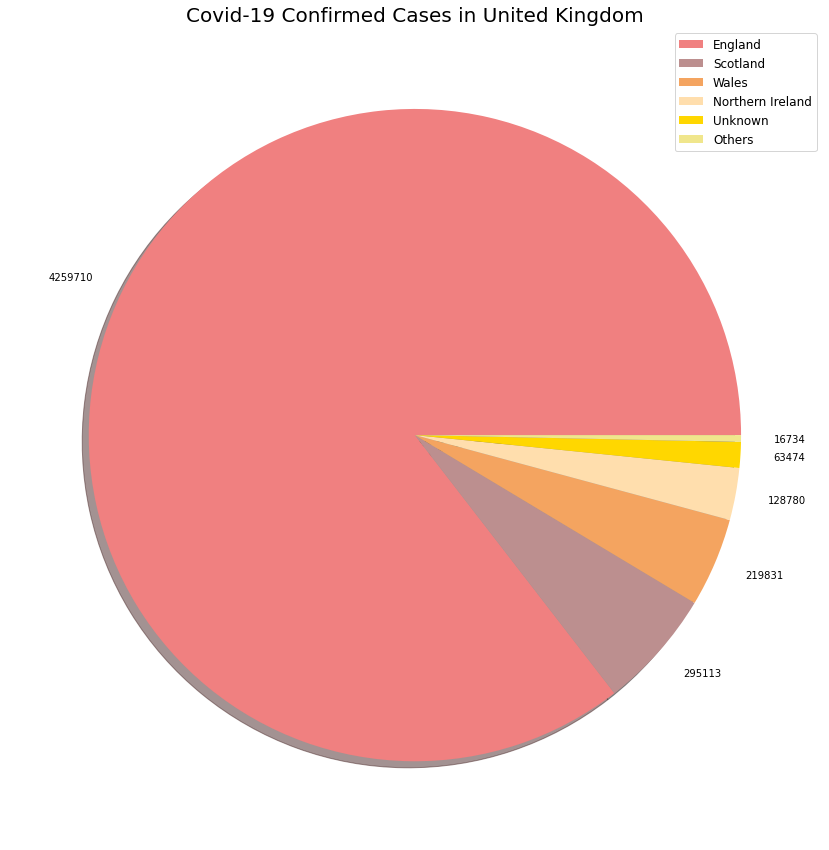

...

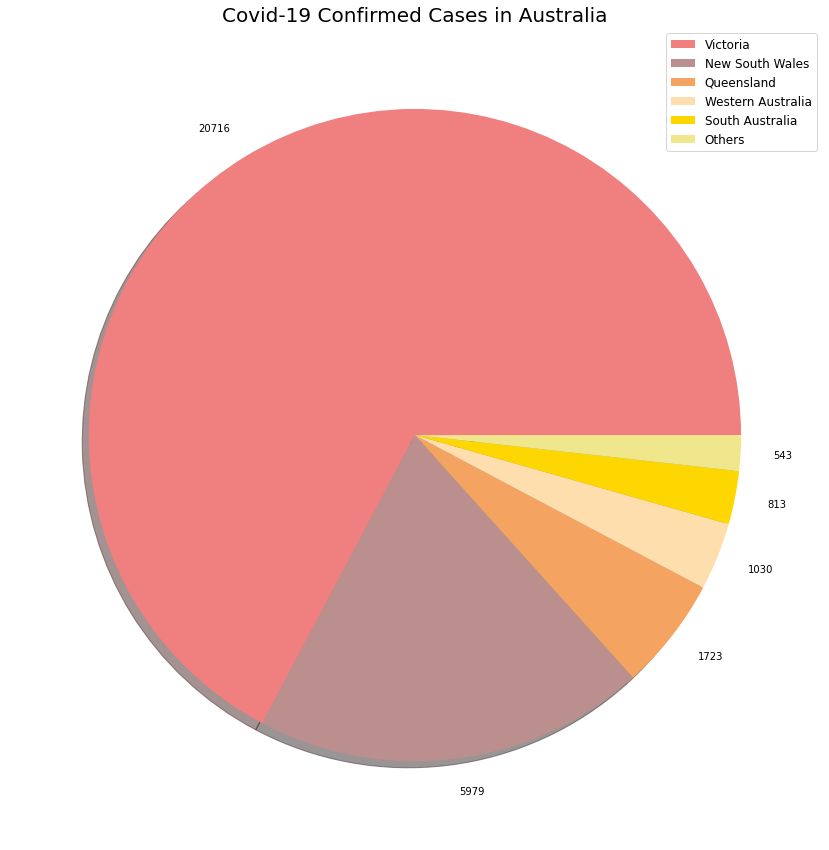

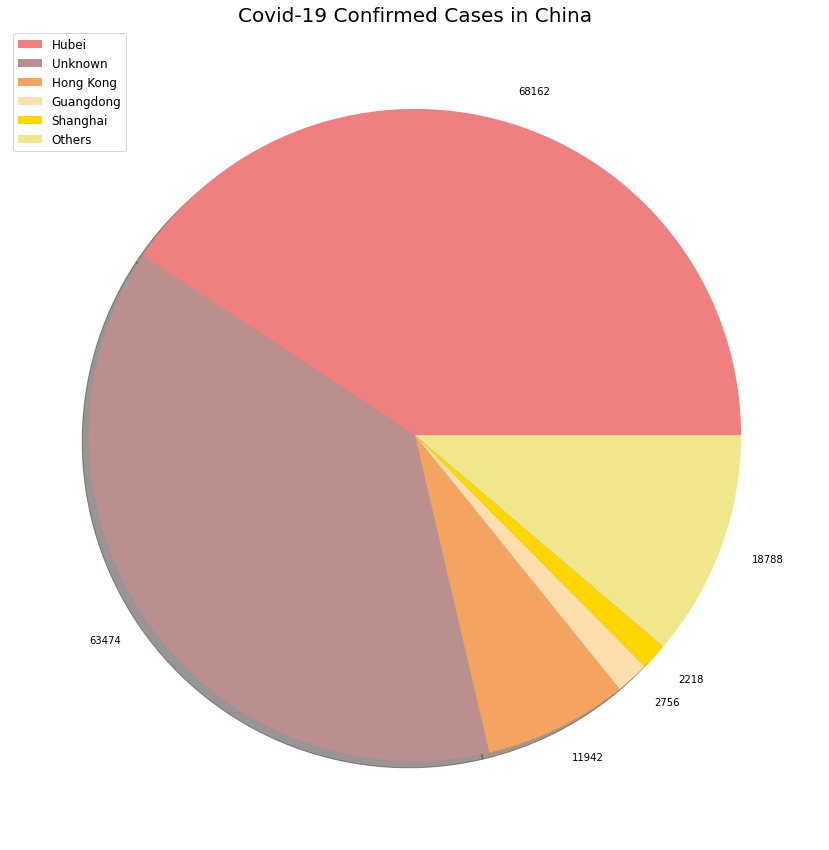

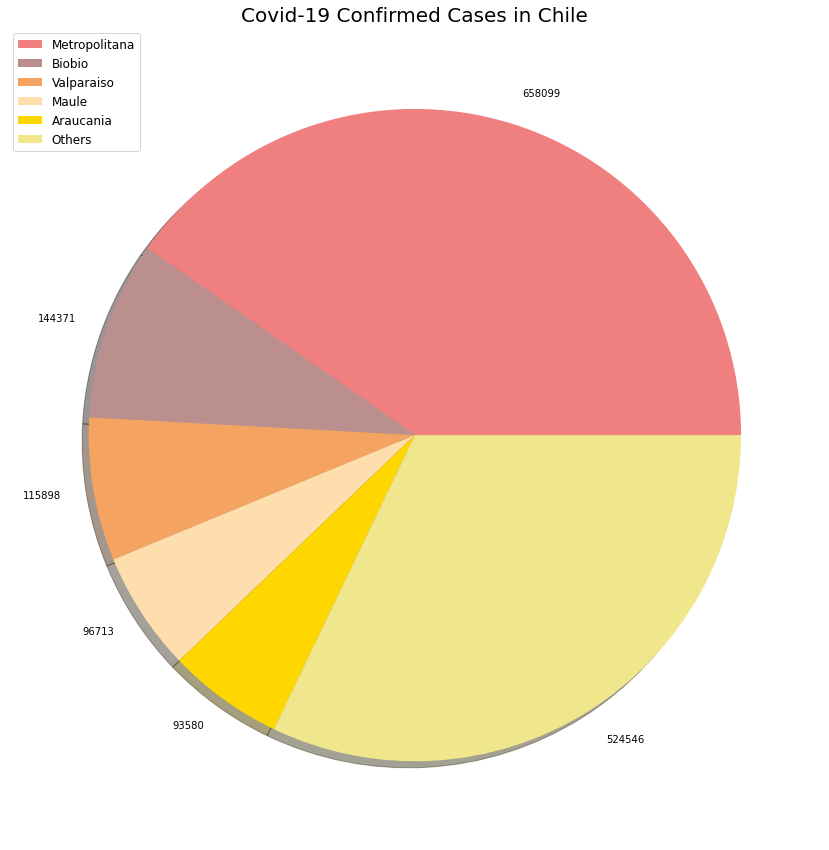

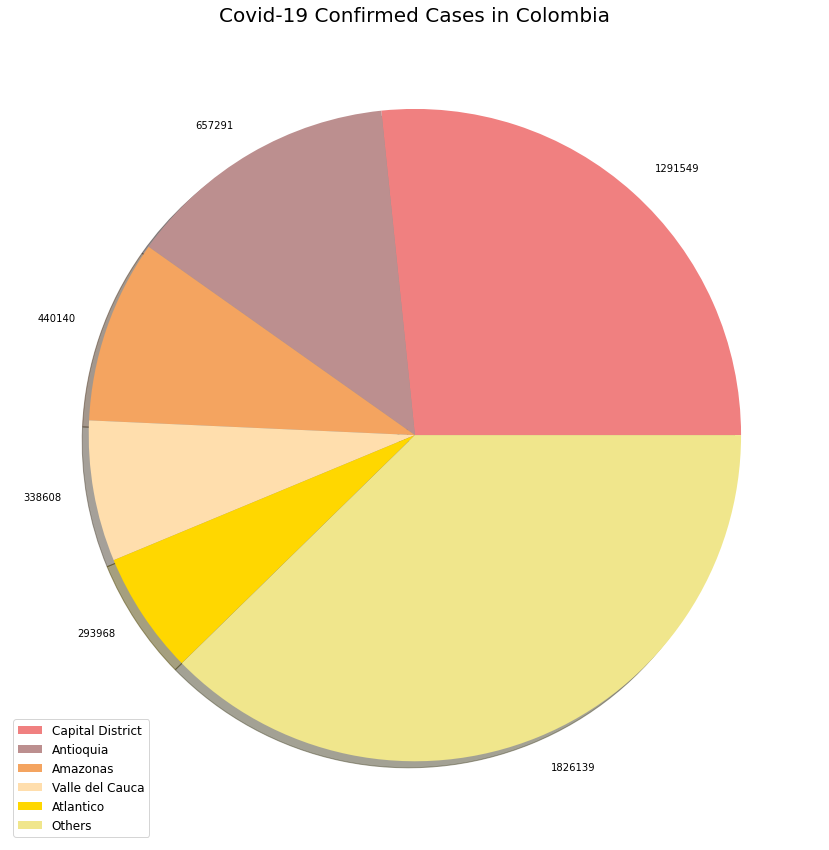

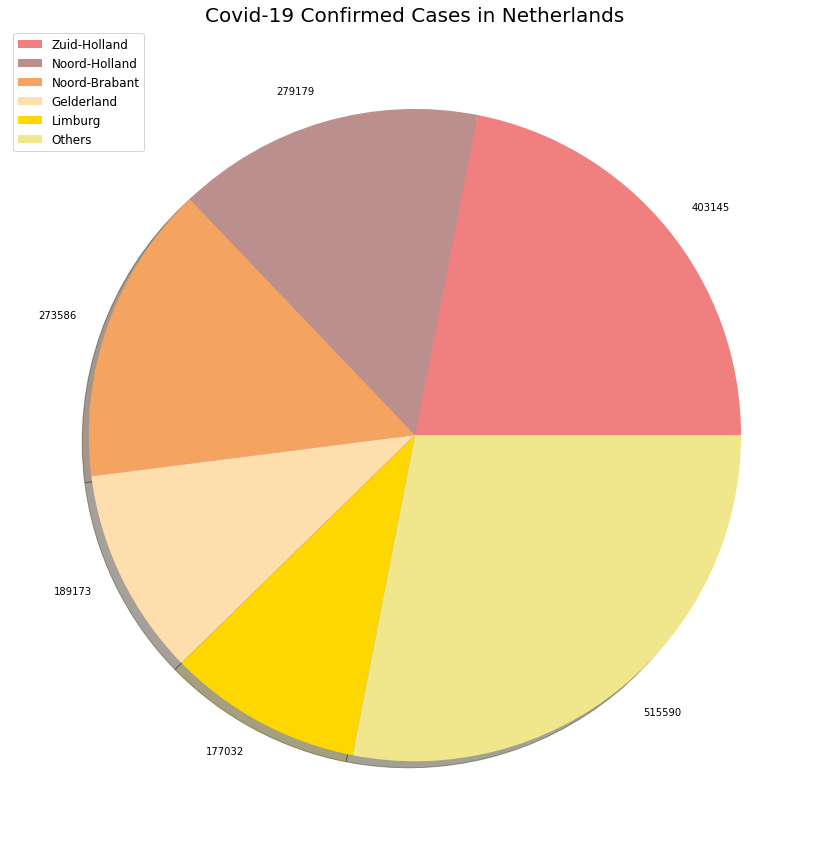

In [67]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'United Kingdom', 'Italy', 'Germany', 'France', 'Spain', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Chile', 'Colombia', 'Netherlands']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))

<a id='hospital_testing'></a>
# US Medical Data on Testing 
This gives us some information on US coronavirus testing, which is important for getting a clear picture of the pandemic.

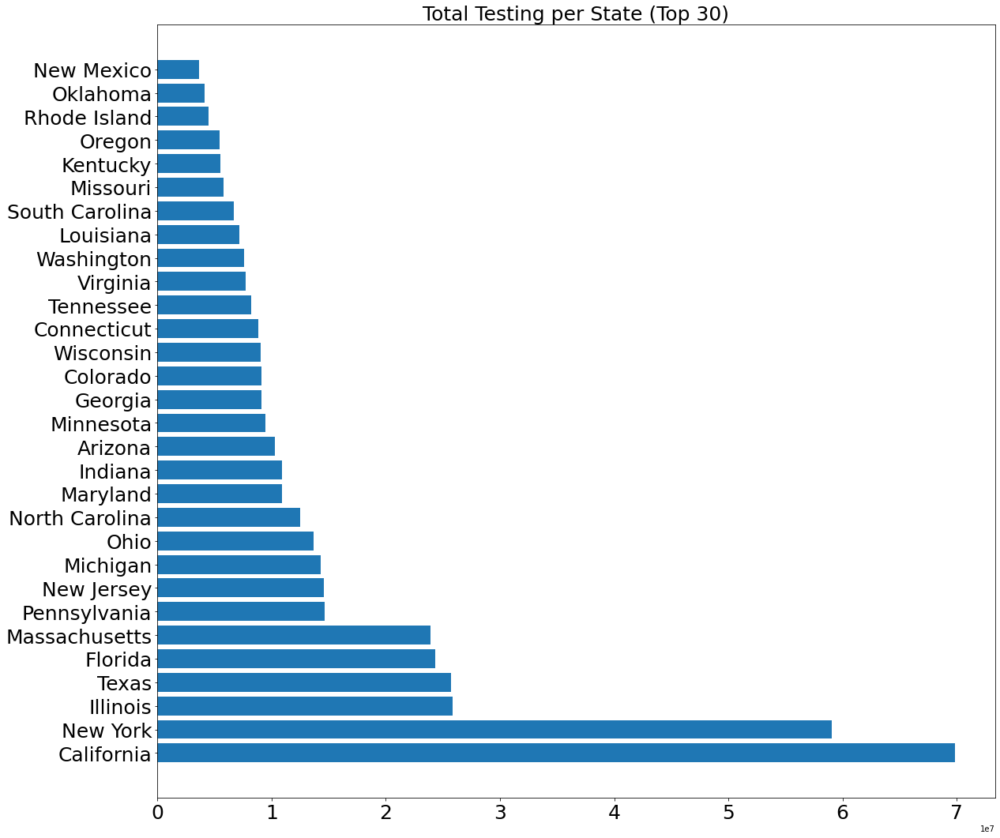

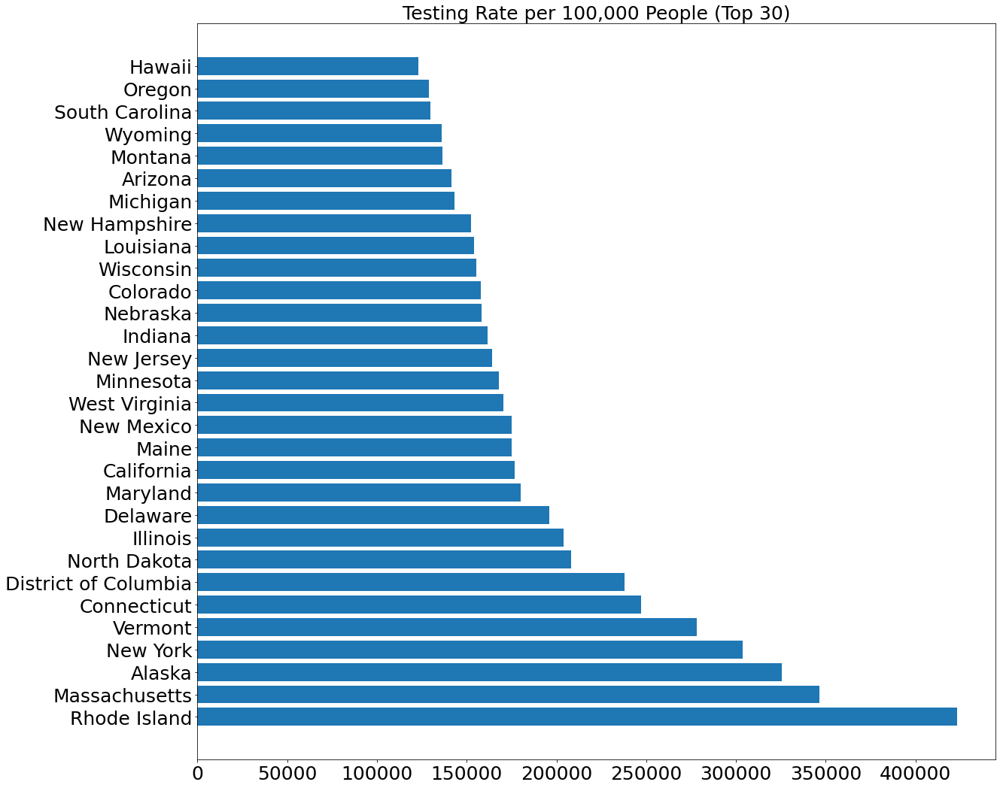

In [68]:
# Replace nan with 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')
 

plot_us_medical_data()

<a id='mobility_data'></a>
# Taking a look at Apple's mobility data.
It can help us understand the relationship between mobility and daily increases in coronavirus cases. The graphs below show the data for U.S. states and territories.

In [69]:
def get_mobility_by_state(transport_type, state, day):
    return apple_mobility[apple_mobility['sub-region']==state][apple_mobility['transportation_type']==transport_type].sum()[day]

In [70]:
apple_mobility.head()

,geo_type,region,transportation_type,alternative_name,sub-region,country,2020-01-13,2020-01-14,2020-01-15,2020-01-16,...,2021-07-09,2021-07-10,2021-07-11,2021-07-12,2021-07-13,2021-07-14,2021-07-15,2021-07-16,2021-07-17,2021-07-18
0,country/region,Albania,driving,NaN,NaN,NaN,100.0,95.30,101.43,97.20,...,252.15,262.14,247.54,246.47,237.87,238.04,250.37,271.72,268.21,263.83
1,country/region,Albania,walking,NaN,NaN,NaN,100.0,100.68,98.93,98.46,...,231.22,215.14,196.89,234.84,226.27,231.51,236.29,244.01,234.80,202.00
2,country/region,Argentina,driving,NaN,NaN,NaN,100.0,97.07,102.45,111.21,...,105.66,109.23,71.06,70.97,74.74,79.38,87.62,110.41,119.97,76.00
3,country/region,Argentina,walking,NaN,NaN,NaN,100.0,95.11,101.37,112.67,...,81.02,88.71,49.75,60.64,65.44,65.97,75.18,89.34,90.67,50.82
4,country/region,Australia,driving,AU,NaN,NaN,100.0,102.98,104.21,108.63,...,104.99,87.32,95.39,99.25,102.74,104.53,96.91,82.88,67.98,79.44


In [71]:
# sample testing 
get_mobility_by_state('walking', 'Connecticut', '2020-07-30')

1104.74

In [72]:
# revising date to fit with the mobility format 
revised_dates = []
for i in range(len(dates)):
    revised_dates.append(datetime.datetime.strptime(dates[i], '%m/%d/%y').strftime('%Y-%m-%d'))

In [73]:
# returns true if it is a weekend, and false if it is a weekday 
def weekday_or_weekend(date):
    date_obj = datetime.datetime.strptime(date, '%Y-%m-%d')
    day_of_the_week =  date_obj.weekday()
    if (day_of_the_week+1) % 6 == 0 or (day_of_the_week+1) % 7 == 0:
        return True 
    else:
        return False 

In [74]:
revised_day_since_1_22 = [i for i in range(len(revised_dates))]

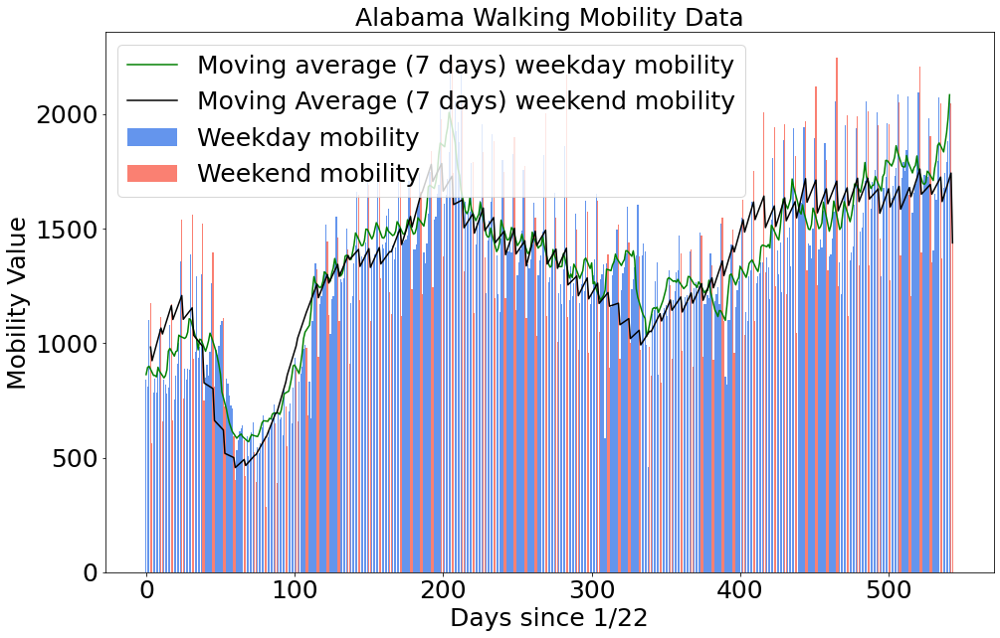

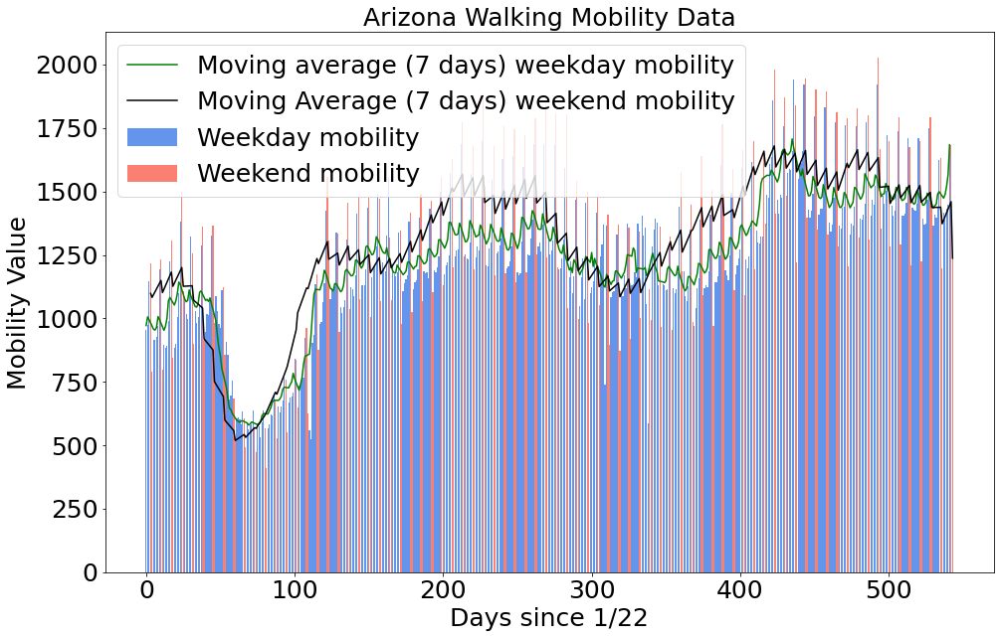

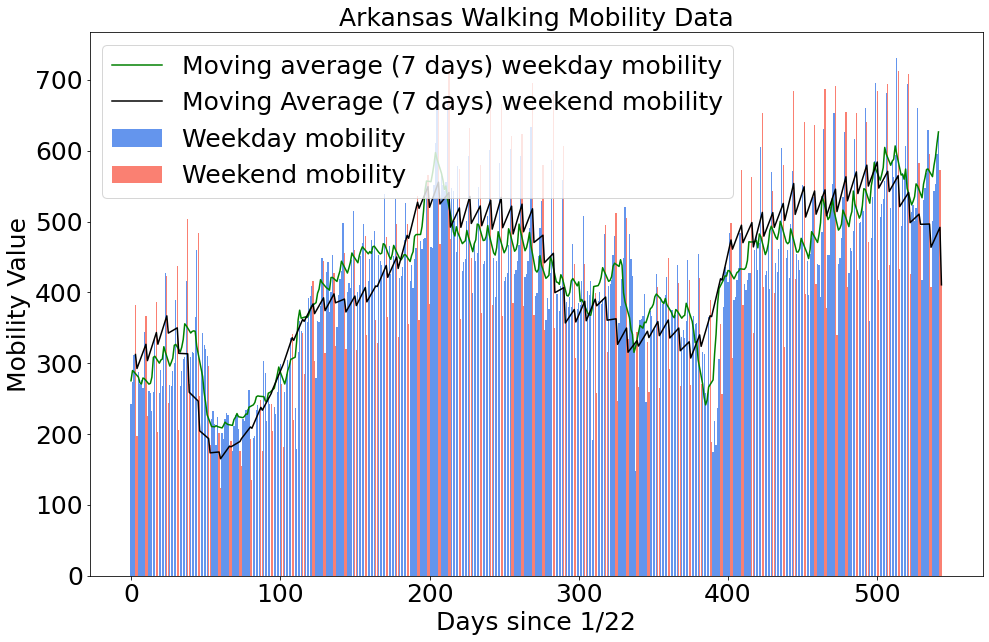

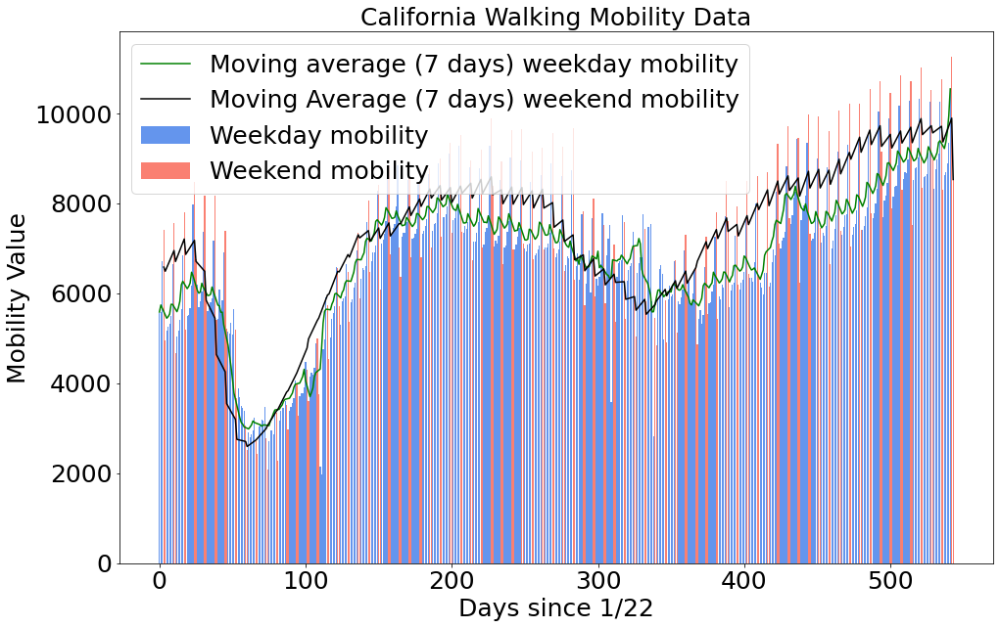

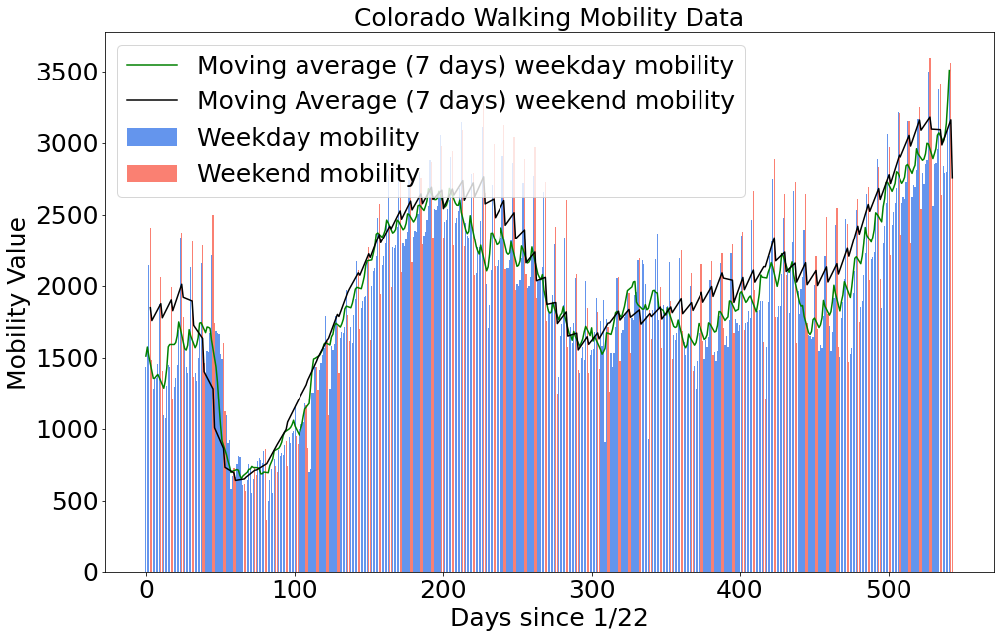

...

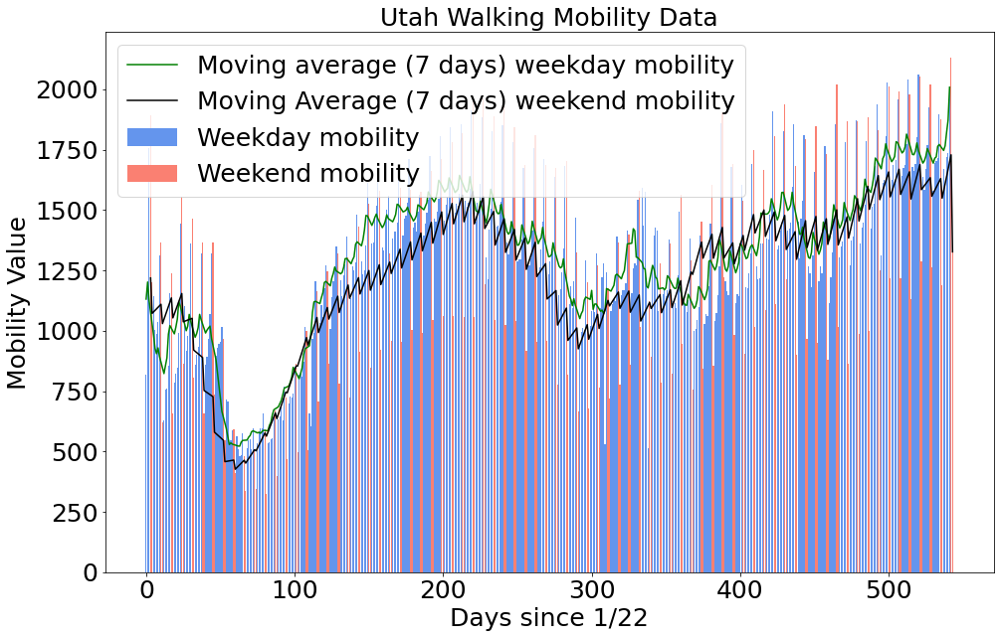

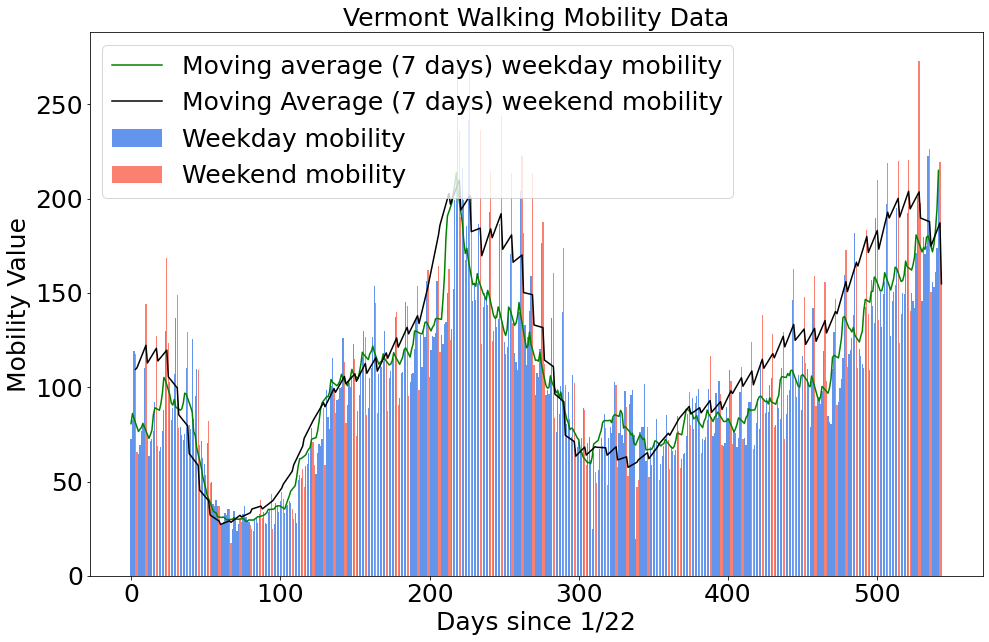

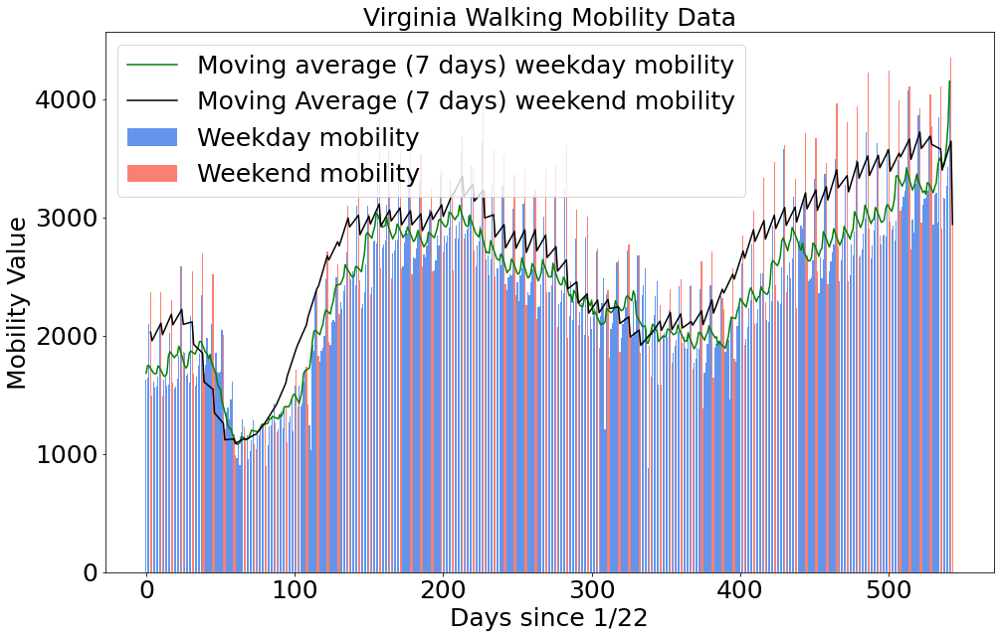

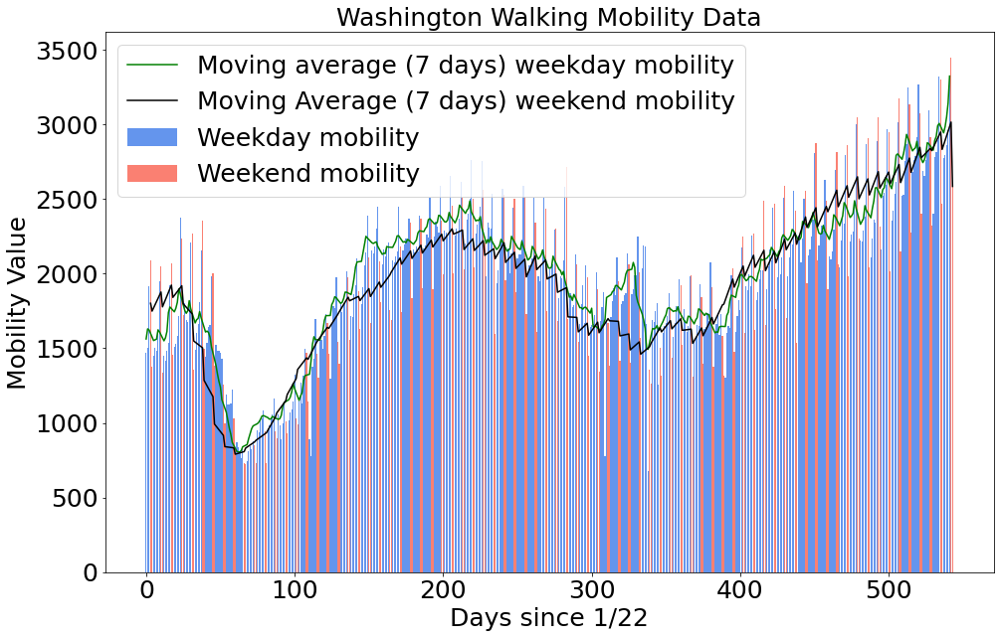

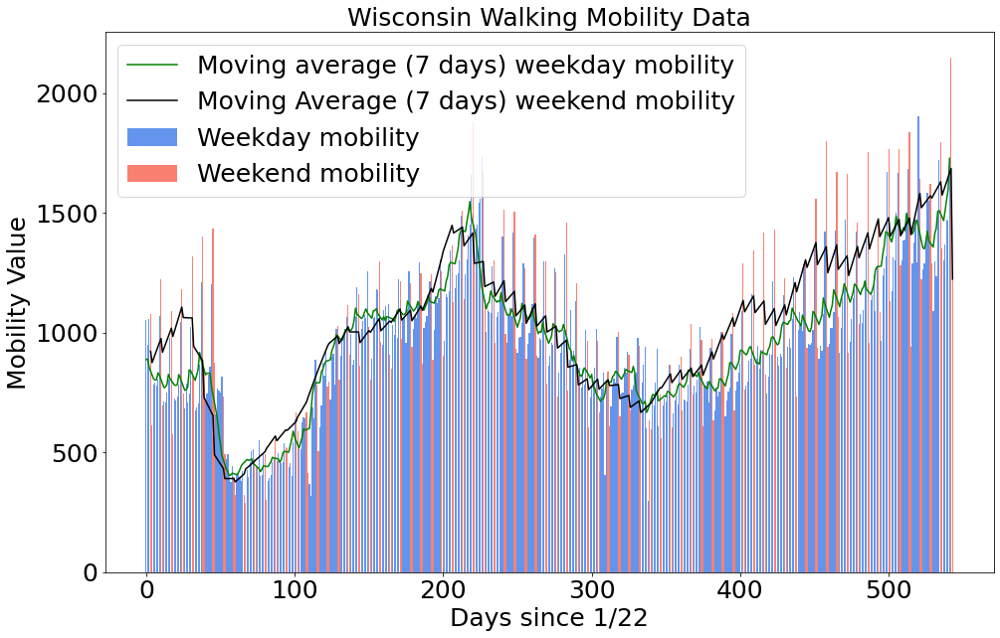

In [75]:
import matplotlib.dates as mdates
states = ['New York', 'Connecticut', 'Florida', 'California', 'Texas', 'Georgia', 'Arizona', 'Illinois', 'Louisiana', 'Ohio',
          'Tennessee', 'North Carolina', 'South Carolina', 'Alabama', 'Missouri', 'Kansas', 'Pennsylvania', 'Wisconsin', 'Virginia', 'Massachusetts', 'Utah', 'Minnesota',
         'Oklahoma', 'Iowa', 'Arkansas', 'Kentucky', 'Puerto Rico', 'Colorado', 'Idaho', 'New Jersey', 'Nevada', 'Maryland', 'Indiana', 'Washington', 'Montana', 'Rhode Island',
         'New Mexico', 'Oregon', 'Vermont', 'North Dakota', 'New Hampshire']
states.sort()

# making sure the dates are in sync 
mobility_latest_date = apple_mobility.columns[-1]
mobility_latest_index = revised_dates.index(mobility_latest_date)

for state in states:
    # weekend and weekday mobility are separated 
    weekday_mobility = []
    weekday_mobility_dates = [] 
    weekend_mobility = [] 
    weekend_mobility_dates = [] 
    
    for i in range(len(revised_dates)):
        if i <= mobility_latest_index:
            if weekday_or_weekend(revised_dates[i]):
                weekend_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekend_mobility_dates.append(i)
            else:
                weekday_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekday_mobility_dates.append(i)
        else:
            pass
        
    # remove null values (they are counted as 0)
    for i in range(len(weekend_mobility)):       
        if weekend_mobility[i] == 0 and i != 0:
            weekend_mobility[i] = weekend_mobility[i-1]
        elif weekend_mobility[i] == 0 and i == 0:
            weekend_mobility[i] = weekend_mobility[i+1]
        else:
            pass
        
    for i in range(len(weekday_mobility)):       
        if weekday_mobility[i] == 0 and i != 0:
            weekday_mobility[i] = weekday_mobility[i-1]
        elif weekday_mobility[i] == 0 and i == 0:
            weekday_mobility[i] = weekday_mobility[i+1]
        else:
            pass
    
    
    weekday_mobility_average = moving_average(weekday_mobility, 7)
    weekend_mobility_average = moving_average(weekend_mobility, 7)
    
    plt.figure(figsize=(16, 10))
    plt.bar(weekday_mobility_dates, weekday_mobility, color='cornflowerblue')
    plt.plot(weekday_mobility_dates, weekday_mobility_average, color='green')
    
    plt.bar(weekend_mobility_dates, weekend_mobility, color='salmon')
    plt.plot(weekend_mobility_dates, weekend_mobility_average, color='black')
    
    plt.legend(['Moving average (7 days) weekday mobility', 'Moving Average (7 days) weekend mobility', 'Weekday mobility', 'Weekend mobility'], prop={'size': 25})
    plt.title('{} Walking Mobility Data'.format(state), size=25)
    plt.xlabel('Days since 1/22', size=25)
    plt.ylabel('Mobility Value', size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()